# Описание Датасета:
- **bodyType** - тип кузова
- **brand** - бренд авто
- **car_url** - ссылка объявление на сайте
- **color** - цвет авто
- **complectation_dict** - cловарь оборудования, входящего в комплектацию
- **description** - реклама салона, условия продавца
- **engineDisplacement** - объём двигателя, л.
- **enginePower** - мощность двигателя, л.с.
- **equipment_dict** - cловарь оборудования, входящего в комплектацию, частично дублирует complectation_dict
- **fuelType** - тип потребляемого топлива
- **image** - ссылка на фото авто на сайте
- **mileage** - пробег, км
- **modelDate** - дата начала выпуска данной модели
- **model_info** - cловарь с данными о модели
- **model_name** - название модели
- **name** - данные об объёме двигателя, мощности авто и типе коробки передач
- **numberOfDoors** - количество дверей
- **parsing_unixtime** - время парсинга
- **priceCurrency** - валюта, в которой указана стоимость авто на сайте
- **productionDate** - дата производства
- **sell_id** - ID номер в базе
- **super_gen** - cловарь с техническими характеристиками
- **vehicleConfiguration** - признак дублирующий (bodyType, engineDisplacement и vehicleTransmission)
- **vehicleTransmission** - тип коробки передач
- **vendor** - регион первичной продажи/производства авто
- **Владельцы** - сведения о количестве предыдущих владельцев
- **Владение** - время последнего владения
- **ПТС** - вид паспорта транспортного средства
- **Привод** - тип привода
- **Руль** - положение руля
- **Состояние** - состояние, в котором находится продаваемое авто
- **Таможня** - сведения о таможне

# Import

In [459]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

sns.set(style="white")
sns.set(style="whitegrid", color_codes=True)
%matplotlib inline

import re
import sys
import json
from collections import Counter

from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import train_test_split
from catboost import CatBoostRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split,RandomizedSearchCV
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor,ExtraTreesRegressor
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import Ridge
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_absolute_percentage_error


import warnings
warnings.filterwarnings('ignore')

import pandas_profiling

pd.set_option('display.max_columns', 200)

In [437]:
print('Python       :', sys.version.split('\n')[0])
print('Numpy        :', np.__version__)

Python       : 3.8.8 (default, Apr 13 2021, 12:59:45) 
Numpy        : 1.20.1


In [438]:
RANDOM_SEED = 42
!pip3 freeze > requirements.txt

# Functions

In [5]:
def IQR_outlier(data, column, verbose=True):
    '''
    Функция для отображения границ межквартильного размаха
    '''
    
    perc25 = data[column].quantile(0.25)
    perc75 = data[column].quantile(0.75)
    IQR = perc75 - perc25
    low = perc25 - 1.5*IQR
    high = perc75 + 1.5*IQR
    count_outliers = len(data[data[column] > high])+len(data[data[column] < low])
    if verbose:
        print('Для признака', column, ':')
        print('25-й перцентиль: {},'.format(perc25)[:-1], '75-й перцентиль: {},'.format(perc75),
              "IQR: {}, ".format(IQR), "Границы выбросов: [{f}, {l}].".format(f=low, l=high))
    return print('Выбросов, согласно IQR: {} | {:2.2%}'.format(count_outliers, count_outliers
                                                               /len(data)))

In [6]:
def replacement(set_X, data, col):
    """Функция замены значений в столбце с помощью словаря"""

    for key in set_X:
        list_change = list(data[data[col].str.contains(key, na=False)][col].unique())
        data[col] = data[col].apply(lambda x: set_X[key] if x in list_change else x)

In [7]:
def replacement_1(set_X, data, col):
    """Функция замены значений в столбце с помощью словаря"""

    for key in set_X:
        data[col] = data[col].apply(lambda x: set_X[key] if x==key else x)

In [8]:
def dict_to_list(value):
    '''Преобразует complectation_dict в список'''
    
    complectation = []
    try:
        complectation_list = re.findall(r'\[.*?\]', str(value))[0][1:-1].split(',')
        for complect in complectation_list:
            complectation.append(complect[1:-1])
        return complectation
    except IndexError:
        return None

In [9]:
def engine_displacement(value):
    """Функция для преобразования признака engineDisplacement"""

    if value == None:
        return value
    else:
        value = re.findall(r'\d\.\d', str(value))
        if value == list():
            value = 0.0
        else:
            value = float(value[0])
    return value

In [10]:
def enginePower(value):
    """Функция для преобразования признака enginePower"""

    if value == 'None':
        return None
    else:
        value = re.findall(r'\d+', str(value))
        if value == list():
            return None
        else:
            value = int(value[0])
    return value

In [11]:
def enginePower_nan(value):
    """Функция для заполнения пропусков в признаке enginePower"""

    if value == None:
        return value
    else:
        value = int(re.findall(r'\(.*л.с.\)', value)[0][1:-6])
        return value

In [12]:
def equipment_dict_to_list(value):
    '''Преобразует equipment_dict в список'''
    
    equipment = []

    equipment_list = re.findall(r'".*?"', str(value))
    for complect in equipment_list:
        equipment.append(complect[1:-1])
    return equipment

In [13]:
def complectation_new(row):
    '''Создание нового признака complectation_new'''
    
    if not row.complectation_dict:
        row.complectation_dict = set()

    if not row.equipment_dict:
        row.equipment_dict = set()

    row['complectation_new'] = set(row.complectation_dict).union(set(row.equipment_dict))
    if not row['complectation_new']:
        row['complectation_new'] = 'not known'

    return row

In [14]:
def model_date(value):
    '''Обработка признака modelDate'''
    
    if value == "None":
        return None
    elif value == "NaN":
        return None
    else:
        try:
            return int(value)
        except:
            print(f'[ERROR] {value} type: {type(value)}')
            return None

In [204]:
def usd(row):
    '''Создание нового признака USD'''
    
    if row.parsing_unixtime == '2020-09-09':
        row['usd'] = 77.7780 / 75.9645
    elif row.parsing_unixtime == '2020-10-21':
        row['usd'] = 77.7780 / 77.7780
    elif row.parsing_unixtime == '2022-02-21':
        row['usd'] = 77.7780 / 75.7619
    elif row.parsing_unixtime == '2020-10-20':
        row['usd'] = 77.7780 / 77.9241
    elif row.parsing_unixtime == '2022-02-22':
        row['usd'] = 77.7780 / 76.7671
    elif row.parsing_unixtime == '2020-10-19':
        row['usd'] = 77.7780 / 77.9644
    elif row.parsing_unixtime == '2022-02-23':
        row['usd'] = 77.7780 / 80.4194
    elif row.parsing_unixtime == '2022-02-24':
        row['usd'] = 77.7780 / 80.4194
    elif row.parsing_unixtime == '2020-10-25':
        row['usd'] = 77.7780 / 76.4667
    elif row.parsing_unixtime == '2020-10-24':
        row['usd'] = 77.7780 / 76.4667
    elif row.parsing_unixtime == '2020-10-26':
        row['usd'] = 77.7780 / 76.4667
    return row

In [16]:
def production_date(value):
    '''Обработка признака productionDate'''
    
    if value == "None":
        return None
    elif value == "NaN":
        return None
    else:
        try:
            return int(value)
        except:
            print(f'[ERROR] {value} type: {type(value)}')
            return None

In [17]:
def vendor(row):
    '''Преобразует vendor в список'''
    
    if row.brand.lower() == 'skoda':
        row.vendor = 'EUROPEAN'
    elif row.brand.lower() == 'audi':
        row.vendor = 'EUROPEAN'
    elif row.brand.lower() == 'honda':
        row.vendor = 'JAPANESE'
    elif row.brand.lower() == 'volvo':
        row.vendor = 'EUROPEAN'
    elif row.brand.lower() == 'volvo':
        row.vendor = 'EUROPEAN'
    elif row.brand.lower() == 'bmw':
        row.vendor = 'EUROPEAN'
    elif row.brand.lower() == 'nissan':
        row.vendor = 'JAPANESE'
    elif row.brand.lower() == 'infiniti':
        row.vendor = 'JAPANESE'
    elif row.brand.lower() == 'mercedes':
        row.vendor = 'EUROPEAN'
    elif row.brand.lower() == 'toyota':
        row.vendor = 'JAPANESE'
    elif row.brand.lower() == 'lexus':
        row.vendor = 'JAPANESE'
    elif row.brand.lower() == 'volkswagen':
        row.vendor = 'EUROPEAN'
    elif row.brand.lower() == 'cadillac':
        row.vendor = 'USA'
    elif row.brand.lower() == 'chery':
        row.vendor = 'CHINESE'
    elif row.brand.lower() == 'chevrolet':
        row.vendor = 'USA'
    elif row.brand.lower() == 'chrysler':
        row.vendor = 'USA'
    elif row.brand.lower() == 'citroen':
        row.vendor = 'EUROPEAN'
    elif row.brand.lower() == 'daewoo':
        row.vendor = 'KOREAN'
    elif row.brand.lower() == 'dodge':
        row.vendor = 'USA'
    elif row.brand.lower() == 'ford':
        row.vendor = 'USA'
    elif row.brand.lower() == 'geely':
        row.vendor = 'CHINESE'
    elif row.brand.lower() == 'hyundai':
        row.vendor = 'KOREAN'
    elif row.brand.lower() == 'jaguar':
        row.vendor = 'EUROPEAN'
    elif row.brand.lower() == 'jaguar':
        row.vendor = 'EUROPEAN'
    elif row.brand.lower() == 'jeep':
        row.vendor = 'USA'
    elif row.brand.lower() == 'kia':
        row.vendor = 'KOREAN'
    elif row.brand.lower() == 'mazda':
        row.vendor = 'JAPANESE'
    elif row.brand.lower() == 'mini':
        row.vendor = 'EUROPEAN'
    elif row.brand.lower() == 'opel':
        row.vendor = 'EUROPEAN'
    elif row.brand.lower() == 'peugeot':
        row.vendor = 'EUROPEAN'
    elif row.brand.lower() == 'porsche':
        row.vendor = 'EUROPEAN'
    elif row.brand.lower() == 'renault':
        row.vendor = 'EUROPEAN'
    elif row.brand.lower() == 'subaru':
        row.vendor = 'JAPANESE'
    elif row.brand.lower() == 'suzuki':
        row.vendor = 'JAPANESE'
    elif row.brand.lower() == 'great_wall':
        row.vendor = 'CHINESE'
    elif row.brand.lower() == 'land_rover':
        row.vendor = 'EUROPEAN'
    elif row.brand.lower() == 'ssang_yong':
        row.vendor = 'KOREAN'
    elif row.brand.lower() == 'mitsubishi':
        row.vendor = 'JAPANESE'
    else:
        row.vendor = 'OTHER'

    return row

In [18]:
def heatmap(data, columns, method):
    '''Построение тепловой карты корреляции'''
    
    corr = data[columns].corr(method=method)
    mask = np.zeros_like(corr)
    mask[np.triu_indices_from(mask)] = True
    with sns.axes_style("white"):
        f, ax = plt.subplots(figsize=(10, 10))
        ax = sns.heatmap(corr, mask=mask, annot=True, square=True, vmin=0, vmax=1)

In [19]:
def mape(y_true, y_pred):
    return np.mean(np.abs((y_pred-y_true)/y_true))

# Data

In [460]:
df_sample_submission = pd.read_csv('sample_submission.csv')
df_test = pd.read_csv('test.csv')
df_train = pd.read_csv('all_auto_ru_09_09_2020.csv')

with open('1.json', 'r', encoding="utf-8") as file:
    data = json.load(file)

df_0 = pd.json_normalize(data)

with open('data_Audi.json', 'r', encoding="utf-8") as file:
    data = json.load(file)

df_Audi = pd.json_normalize(data)

with open('data_BMW.json', 'r', encoding="utf-8") as file:
    data = json.load(file)

df_BMW = pd.json_normalize(data)

with open('data_Chery.json', 'r', encoding="utf-8") as file:
    data = json.load(file)

df_Chery = pd.json_normalize(data)

In [21]:
print('df_sample_submission:')
display(df_sample_submission.head())

df_sample_submission:


,sell_id,price
0,1100575026,0
1,1100549428,0
2,1100658222,0
3,1100937408,0
4,1101037972,0


In [21]:
print("Размер датасета df_sample_submission:", df_sample_submission.shape)
print()
df_sample_submission.info()

Размер датасета df_sample_submission: (34686, 2)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34686 entries, 0 to 34685
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   sell_id  34686 non-null  int64
 1   price    34686 non-null  int64
dtypes: int64(2)
memory usage: 542.1 KB


In [23]:
print('df_test:')
display(df_test.head())

df_test:


,bodyType,brand,car_url,color,complectation_dict,description,engineDisplacement,enginePower,equipment_dict,fuelType,image,mileage,modelDate,model_info,model_name,name,numberOfDoors,parsing_unixtime,priceCurrency,productionDate,sell_id,super_gen,vehicleConfiguration,vehicleTransmission,vendor,Владельцы,Владение,ПТС,Привод,Руль,Состояние,Таможня
0,лифтбек,SKODA,https://auto.ru/cars/used/sale/skoda/octavia/1...,синий,NaN,"Все автомобили, представленные в продаже, прох...",1.2 LTR,105 N12,"{""engine-proof"":true,""tinted-glass"":true,""airb...",бензин,https://autoru.naydex.net/o9DBXQ270/5ac010hAY0...,74000,2013,"{""code"":""OCTAVIA"",""name"":""Octavia"",""ru_name"":""...",OCTAVIA,1.2 AMT (105 л.с.),5,1603226273,RUB,2014,1100575026,"{""id"":""10373605"",""displacement"":1197,""engine_t...",LIFTBACK ROBOT 1.2,роботизированная,EUROPEAN,3 или более,NaN,Оригинал,передний,Левый,Не требует ремонта,Растаможен
1,лифтбек,SKODA,https://auto.ru/cars/used/sale/skoda/octavia/1...,чёрный,NaN,ЛОТ: 01217195\nАвтопрага Север\nДанный автомоб...,1.6 LTR,110 N12,"{""cruise-control"":true,""asr"":true,""esp"":true,""...",бензин,https://autoru.naydex.net/o9DBXQ270/5ac010hAY0...,60563,2017,"{""code"":""OCTAVIA"",""name"":""Octavia"",""ru_name"":""...",OCTAVIA,1.6 MT (110 л.с.),5,1603226277,RUB,2017,1100549428,"{""id"":""20913311"",""displacement"":1598,""engine_t...",LIFTBACK MECHANICAL 1.6,механическая,EUROPEAN,1 владелец,NaN,Оригинал,передний,Левый,Не требует ремонта,Растаможен
2,лифтбек,SKODA,https://auto.ru/cars/used/sale/skoda/superb/11...,серый,"{""id"":""20026336"",""name"":""Ambition"",""available_...","Все автомобили, представленные в продаже, прох...",1.8 LTR,152 N12,"{""cruise-control"":true,""tinted-glass"":true,""es...",бензин,https://avatars.mds.yandex.net/get-autoru-vos/...,88000,2013,"{""code"":""SUPERB"",""name"":""Superb"",""ru_name"":""Су...",SUPERB,DSG 1.8 AMT (152 л.с.),5,1603226280,RUB,2014,1100658222,"{""id"":""20026323"",""nameplate"":""DSG"",""displaceme...",LIFTBACK ROBOT 1.8,роботизированная,EUROPEAN,1 владелец,NaN,Оригинал,передний,Левый,Не требует ремонта,Растаможен
3,лифтбек,SKODA,https://auto.ru/cars/used/sale/skoda/octavia/1...,коричневый,"{""id"":""20803582"",""name"":""Ambition"",""available_...",КОМПЛЕКТ ЗИМНЕЙ (ЛЕТНЕЙ) РЕЗИНЫ ПО СЕЗОНУ В ПО...,1.6 LTR,110 N12,"{""cruise-control"":true,""roller-blind-for-rear-...",бензин,https://autoru.naydex.net/o9DBXQ270/5ac010hAY0...,95000,2013,"{""code"":""OCTAVIA"",""name"":""Octavia"",""ru_name"":""...",OCTAVIA,1.6 AT (110 л.с.),5,1603226284,RUB,2014,1100937408,"{""id"":""20105521"",""displacement"":1598,""engine_t...",LIFTBACK AUTOMATIC 1.6,автоматическая,EUROPEAN,1 владелец,NaN,Оригинал,передний,Левый,Не требует ремонта,Растаможен
4,лифтбек,SKODA,https://auto.ru/cars/used/sale/skoda/octavia/1...,белый,NaN,ЛОТ: 01220889\nАвтопрага Север\n\nВы можете по...,1.8 LTR,152 N12,"{""cruise-control"":true,""asr"":true,""esp"":true,""...",бензин,https://autoru.naydex.net/o9DBXQ270/5ac010hAY0...,58536,2008,"{""code"":""OCTAVIA"",""name"":""Octavia"",""ru_name"":""...",OCTAVIA,1.8 AT (152 л.с.),5,1603226288,RUB,2012,1101037972,"{""id"":""4561004"",""displacement"":1798,""engine_ty...",LIFTBACK AUTOMATIC 1.8,автоматическая,EUROPEAN,1 владелец,NaN,Оригинал,передний,Левый,Не требует ремонта,Растаможен


In [25]:
print("Размер датасета df_test:", df_test.shape)
print()
df_test.info()

Размер датасета df_test: (34686, 32)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34686 entries, 0 to 34685
Data columns (total 32 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   bodyType              34686 non-null  object
 1   brand                 34686 non-null  object
 2   car_url               34686 non-null  object
 3   color                 34686 non-null  object
 4   complectation_dict    6418 non-null   object
 5   description           34686 non-null  object
 6   engineDisplacement    34686 non-null  object
 7   enginePower           34686 non-null  object
 8   equipment_dict        24690 non-null  object
 9   fuelType              34686 non-null  object
 10  image                 34686 non-null  object
 11  mileage               34686 non-null  int64 
 12  modelDate             34686 non-null  int64 
 13  model_info            34686 non-null  object
 14  model_name            34686 non-null  object
 15

In [26]:
print('df_train:')
display(df_train.head())

df_train:


,bodyType,brand,color,fuelType,modelDate,name,numberOfDoors,productionDate,vehicleConfiguration,vehicleTransmission,engineDisplacement,enginePower,description,mileage,Комплектация,Привод,Руль,Состояние,Владельцы,ПТС,Таможня,Владение,price,start_date,hidden,model
0,Седан,AUDI,040001,бензин,1990.0,2.8 MT (174 л.с.) 4WD,4.0,1991,SEDAN MECHANICAL 2.8,MECHANICAL,2.8,174.0,"Машина в приличном состоянии ,не гнилая не р...",350000,{'id': '0'},полный,LEFT,NaN,3.0,ORIGINAL,True,NaN,200000.0,2019-10-03T08:09:11Z,NaN,100
1,Седан,AUDI,EE1D19,бензин,1982.0,1.8 MT (90 л.с.),4.0,1986,SEDAN MECHANICAL 1.8,MECHANICAL,1.8,90.0,Машина в оригинале не гнилая все вопросы по те...,173424,{'id': '0'},передний,LEFT,NaN,3.0,ORIGINAL,True,NaN,60000.0,2020-09-06T06:49:40Z,NaN,100
2,Универсал 5 дв.,AUDI,0000CC,бензин,1988.0,2.3 MT (136 л.с.) 4WD,5.0,1989,WAGON_5_DOORS MECHANICAL 2.3,MECHANICAL,2.3,136.0,ПТС Оригинал!\nПолный комплект ключей!\nПо рез...,230000,{'id': '0'},полный,LEFT,NaN,3.0,ORIGINAL,True,NaN,99000.0,2020-09-02T14:04:21Z,NaN,100
3,Седан,AUDI,CACECB,бензин,1988.0,1.8 MT (90 л.с.),4.0,1989,SEDAN MECHANICAL 1.8,MECHANICAL,1.8,90.0,NaN,240000,{'id': '0'},передний,LEFT,NaN,3.0,ORIGINAL,True,NaN,65000.0,2020-08-23T17:40:09Z,NaN,100
4,Седан,AUDI,040001,бензин,1990.0,2.0 MT (101 л.с.),4.0,1991,SEDAN MECHANICAL 2.0,MECHANICAL,2.0,101.0,"Машина не гнилая, дыр нет, днище целое, даже в...",300000,{'id': '0'},передний,LEFT,NaN,3.0,DUPLICATE,True,NaN,100000.0,2020-09-08T09:22:07Z,NaN,100


In [27]:
print("Размер датасета df_train:", df_train.shape)
print()
df_train.info()

Размер датасета df_train: (89378, 26)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89378 entries, 0 to 89377
Data columns (total 26 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   bodyType              89377 non-null  object 
 1   brand                 89378 non-null  object 
 2   color                 89378 non-null  object 
 3   fuelType              89378 non-null  object 
 4   modelDate             89377 non-null  float64
 5   name                  89377 non-null  object 
 6   numberOfDoors         89377 non-null  float64
 7   productionDate        89378 non-null  int64  
 8   vehicleConfiguration  89377 non-null  object 
 9   vehicleTransmission   89377 non-null  object 
 10  engineDisplacement    89377 non-null  object 
 11  enginePower           89377 non-null  float64
 12  description           86124 non-null  object 
 13  mileage               89378 non-null  int64  
 14  Комплектация          89378 non

In [28]:
print('df_0:')
display(df_0.head())

df_0:


,bodyType,brand,car_url,color,complectation_dict,description,engineDisplacement,enginePower,equipment_dict,fuelType,image,mileage,modelDate,model_info,model_name,name,numberOfDoors,parsing_unixtime,priceCurrency,productionDate,sell_id,super_gen,vehicleConfiguration,vehicleTransmission,vendor,Владельцы,ПТС,Руль,Привод,Таможня,Состояние,Стоимость,Стоимость второй источник
0,универсал 5 дв.,audi,https://auto.ru/cars/used/sale/audi/a4/1106680...,коричневый,"[""equipmentGroups"":[{""name"":""Безопасность"",""va...",Официальный дилер Рено\n\nПокупался у официал...,1.8 л / 170 л.с. /,170,"[""equipment"":{""tinted-glass"":true,""esp"":true,""...",Бензин,[https://autoru.naydex.net/uE2Ga6355/d37e97cwn...,113000,2012,"""code"":""AUDI"",""name"":""Audi"",""ru_name"":""Ауди"",""...",Audi,1.8 CVT (170 л.с.),5,1645421880,ruble,2012,"""sale_id"":""1106680023""","{""id"":""7754683"",""name"":""IV (B8) Рестайлинг"",""r...",,вариатор,EUROPEAN,3 или более,Оригинал,Левый,передний,Растаможен,Не требует ремонта,1 234 000 ₽,1234000
1,внедорожник 5 дв.,audi,https://auto.ru/cars/used/sale/audi/q7/1106340...,белый,[],"Автомобиль в отличном состоянии,куплен новым у...",3.0 л / 249 л.с. /,249,"[""equipment"":{}]",Дизель,[https://avatars.mds.yandex.net/get-autoru-vos...,110000,2019,"""code"":""AUDI"",""name"":""Audi"",""ru_name"":""Ауди"",""...",Audi,3.0d AT (249 л.с.) 4WD,5,1645421897,ruble,2019,"""sale_id"":""1106340889""","{""id"":""20368749"",""name"":""II (4M)"",""ru_name"":""2...",,автоматическая,EUROPEAN,1 владелец,Оригинал,Левый,полный,Растаможен,Не требует ремонта,None,None
2,седан,audi,https://auto.ru/cars/used/sale/audi/a6/1106523...,чёрный,"[""equipmentGroups"":[{""name"":""Безопасность"",""va...","∙ 2 ключа∙ Комплектация ,бизнес ( комбин...",2.0 л / 249 л.с. /,249,"[""equipment"":{""cruise-control"":true,""tinted-gl...",Бензин,[https://avatars.mds.yandex.net/get-autoru-vos...,43908,2018,"""code"":""AUDI"",""name"":""Audi"",""ru_name"":""Ауди"",""...",Audi,2.0 AMT (249 л.с.) 4WD,4,1645421909,ruble,2018,"""sale_id"":""1106523271""","{""id"":""20246005"",""name"":""IV (C7) Рестайлинг"",""...",,роботизированная,EUROPEAN,3 или более,Оригинал,Левый,полный,Растаможен,Не требует ремонта,2 567 000 ₽,2567000
3,седан,audi,https://auto.ru/cars/used/sale/audi/a4/1106546...,коричневый,"[""equipmentGroups"":[{""name"":""Безопасность"",""va...",Преимущества данного авто:\n— 1 собственник— П...,1.8 л / 170 л.с. /,170,"[""equipment"":{""asr"":true,""esp"":true,""usb"":true...",Бензин,[https://avatars.mds.yandex.net/get-autoru-vos...,99000,2013,"""code"":""AUDI"",""name"":""Audi"",""ru_name"":""Ауди"",""...",Audi,1.8 CVT (170 л.с.),4,1645421918,ruble,2013,"""sale_id"":""1106546173""","{""id"":""7754683"",""name"":""IV (B8) Рестайлинг"",""r...",,вариатор,EUROPEAN,1 владелец,Оригинал,Левый,передний,Растаможен,Не требует ремонта,1 095 000 ₽,1095000
4,лифтбек,audi,https://auto.ru/cars/used/sale/audi/a7/1114852...,белый,[],"Авто в отличном состоянии,до налоговый,не прок...",2.8 л / 204 л.с. /,204,"[""equipment"":{}]",Бензин,[https://avatars.mds.yandex.net/get-autoru-vos...,131000,2011,"""code"":""AUDI"",""name"":""Audi"",""ru_name"":""Ауди"",""...",Audi,2.8 AMT (204 л.с.) 4WD,5,1645421929,ruble,2011,"""sale_id"":""1114852579""","{""id"":""6457121"",""name"":""I (4G)"",""ru_name"":""1 (...",,роботизированная,EUROPEAN,3 или более,Оригинал,Левый,полный,Растаможен,Не требует ремонта,1 600 000 ₽,1600000


In [29]:
print("Размер датасета df_0:", df_0.shape)
print()
df_0.info()

Размер датасета df_0: (14982, 33)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14982 entries, 0 to 14981
Data columns (total 33 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   bodyType                   14982 non-null  object
 1   brand                      14982 non-null  object
 2   car_url                    14982 non-null  object
 3   color                      14982 non-null  object
 4   complectation_dict         14982 non-null  object
 5   description                14691 non-null  object
 6   engineDisplacement         14904 non-null  object
 7   enginePower                14982 non-null  object
 8   equipment_dict             14982 non-null  object
 9   fuelType                   14904 non-null  object
 10  image                      14981 non-null  object
 11  mileage                    14982 non-null  object
 12  modelDate                  14982 non-null  object
 13  model_info                

In [31]:
print('df_Audi:')
display(df_Audi.head())

df_Audi:


,bodyType,brand,car_url,color,complectation_dict,description,engineDisplacement,enginePower,equipment_dict,fuelType,image,mileage,modelDate,model_info,model_name,name,numberOfDoors,parsing_unixtime,priceCurrency,productionDate,sell_id,super_gen,vehicleConfiguration,vehicleTransmission,vendor,Владельцы,ПТС,Руль,Привод,Таможня,Состояние,Стоимость,Стоимость второй источник
0,седан,audi,https://auto.ru/cars/used/sale/audi/a6/1106255...,чёрный,"[""equipmentGroups"":[{""name"":""Безопасность"",""va...",АВТОРАССРОЧКА НА АВТОМОБИЛИ С ПРОБЕГОМ 0%!*\nП...,2.0 л / 249 л.с. /,249,"[""equipment"":{""cruise-control"":true,""asr"":true...",Бензин,[https://avatars.mds.yandex.net/get-autoru-vos...,106220,2018,"""code"":""AUDI"",""name"":""Audi"",""ru_name"":""Ауди"",""...",Audi,2.0 AMT (249 л.с.) 4WD,4,1645621960,ruble,2018,"""sale_id"":""1106255677""","{""id"":""20246005"",""name"":""IV (C7) Рестайлинг"",""...",,роботизированная,EUROPEAN,2 владельца,Оригинал,Левый,полный,Растаможен,Не требует ремонта,2 529 000 ₽,2529000
1,седан,audi,https://auto.ru/cars/used/sale/audi/a3/1106260...,синий,"[""equipmentGroups"":[{""name"":""Безопасность"",""va...",Автомобиль продаётся официальным дилером BMW -...,1.4 л / 150 л.с. /,150,"[""equipment"":{""asr"":true,""esp"":true,""usb"":true...",Бензин,[https://avatars.mds.yandex.net/get-autoru-vos...,5859,2021,"""code"":""AUDI"",""name"":""Audi"",""ru_name"":""Ауди"",""...",Audi,35 TFSI 1.4 AT (150 л.с.),4,1645621971,ruble,2021,"""sale_id"":""1106260755""","{""id"":""21837610"",""name"":""IV (8Y)"",""ru_name"":""4...",,автоматическая,EUROPEAN,1 владелец,Оригинал,Левый,передний,Растаможен,Не требует ремонта,2 629 000 ₽,2629000
2,универсал 5 дв.,audi,https://auto.ru/cars/used/sale/audi/a4_allroad...,чёрный,"[""equipmentGroups"":[{""name"":""Безопасность"",""va...","Продаю отличный автомобиль, обслуживался на ди...",2.0 л / 225 л.с. /,225,"[""equipment"":{""cruise-control"":true,""tinted-gl...",Бензин,[https://avatars.mds.yandex.net/get-autoru-vos...,170000,2013,"""code"":""AUDI"",""name"":""Audi"",""ru_name"":""Ауди"",""...",Audi,7S-tronic 2.0 AMT (225 л.с.) 4WD,5,1645621978,ruble,2013,"""sale_id"":""1114855207""","{""id"":""7754720"",""name"":""IV (B8) Рестайлинг"",""r...",,роботизированная,EUROPEAN,3 или более,Оригинал,Левый,полный,Растаможен,Не требует ремонта,1 690 000 ₽,1690000
3,седан,audi,https://auto.ru/cars/used/sale/audi/a4/1114681...,серый,"[""equipmentGroups"":[{""name"":""Безопасность"",""va...",Последнее ТО 03.02.2022Сделано:1)Пыльники пере...,2.0 л / 200 л.с. /,200,"[""equipment"":{""esp"":true,""sport-seats"":true,""l...",Бензин,[https://avatars.mds.yandex.net/get-autoru-vos...,205000,2007,"""code"":""AUDI"",""name"":""Audi"",""ru_name"":""Ауди"",""...",Audi,2.0 AT (200 л.с.) 4WD,4,1645621986,ruble,2007,"""sale_id"":""1114681316""","{""id"":""2305334"",""name"":""III (B7)"",""ru_name"":""3...",,автоматическая,EUROPEAN,3 или более,Оригинал,Левый,полный,Растаможен,Не требует ремонта,790 000 ₽,790000
4,внедорожник 5 дв.,audi,https://auto.ru/cars/used/sale/audi/q7/1105851...,чёрный,"[""equipmentGroups"":[{""name"":""Безопасность"",""va...",Просьба перекупщиков и автосалоны не беспокоит...,3.0 л / 249 л.с. /,249,"[""equipment"":{""cruise-control"":true,""asr"":true...",Дизель,[https://avatars.mds.yandex.net/get-autoru-vos...,24300,2021,"""code"":""AUDI"",""name"":""Audi"",""ru_name"":""Ауди"",""...",Audi,45 TDI 3.0d AT (249 л.с.) 4WD,5,1645621992,ruble,2021,"""sale_id"":""1105851205""","{""id"":""21646875"",""name"":""II (4M) Рестайлинг"",""...",,автоматическая,EUROPEAN,1 владелец,Оригинал,Левый,полный,Растаможен,Не требует ремонта,7 600 000 ₽,7600000


In [30]:
print("Размер датасета df_Audi:", df_Audi.shape)
print()
df_Audi.info()

Размер датасета df_Audi: (1900, 33)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1900 entries, 0 to 1899
Data columns (total 33 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   bodyType                   1856 non-null   object
 1   brand                      1900 non-null   object
 2   car_url                    1900 non-null   object
 3   color                      1856 non-null   object
 4   complectation_dict         1856 non-null   object
 5   description                1816 non-null   object
 6   engineDisplacement         1825 non-null   object
 7   enginePower                1856 non-null   object
 8   equipment_dict             1856 non-null   object
 9   fuelType                   1825 non-null   object
 10  image                      1856 non-null   object
 11  mileage                    1856 non-null   object
 12  modelDate                  1856 non-null   object
 13  model_info                

In [32]:
print('df_BMW:')
display(df_BMW.head())

df_BMW:


,bodyType,brand,car_url,color,complectation_dict,description,engineDisplacement,enginePower,equipment_dict,fuelType,image,mileage,modelDate,model_info,model_name,name,numberOfDoors,parsing_unixtime,priceCurrency,productionDate,sell_id,super_gen,vehicleConfiguration,vehicleTransmission,vendor,Владельцы,ПТС,Руль,Привод,Таможня,Состояние,Стоимость,Стоимость второй источник
0,внедорожник 5 дв.,bmw,https://auto.ru/cars/used/sale/bmw/x7/11063450...,чёрный,"[""equipmentGroups"":[{""name"":""Безопасность"",""va...","🟢ВНИМАТЕЛЬНО ЧИТАЙТЕ ОБЪЯВЛЕНИЕ 🟢Цена, указанн...",3.0 л / 249 л.с. /,249,"[""equipment"":{""cruise-control"":true,""esp"":true...",Дизель,[https://autoru.naydex.net/ezGc15090/98d32cVaa...,5500,2021,"""code"":""BMW"",""name"":""BMW"",""ru_name"":""БМВ"",""logo""",BMW,30d 3.0d AT (249 л.с.) 4WD,5,1645633245,ruble,2021,"""sale_id"":""1106345065""","{""id"":""21406086"",""name"":""I (G07)"",""ru_name"":""1...",,автоматическая,EUROPEAN,1 владелец,Оригинал,Левый,полный,Растаможен,Не требует ремонта,8 900 000 ₽,8900000
1,None,bmw,https://auto.ru/cars/used/sale/bmw/x5_m/110546...,None,None,None,None,None,None,None,None,None,None,None,None,None,None,1645633246,other,None,None,None,,None,None,None,None,None,None,None,None,None,None
2,седан,bmw,https://auto.ru/cars/used/sale/bmw/3er/1106486...,чёрный,[],Полностью в исправном состоянии.Резина зима/ле...,3.0 л / 231 л.с. /,231,"[""equipment"":{}]",Бензин,[https://avatars.mds.yandex.net/get-autoru-vos...,270000,2004,"""code"":""BMW"",""name"":""BMW"",""ru_name"":""БМВ"",""logo""",BMW,330i 3.0 AT (231 л.с.),4,1645633252,ruble,2004,"""sale_id"":""1106486057""","{""id"":""7690949"",""name"":""IV (E46) Рестайлинг"",""...",,автоматическая,EUROPEAN,3 или более,Оригинал,Левый,задний,Растаможен,Не требует ремонта,755 000 ₽,755000
3,хэтчбек 5 дв.,bmw,https://auto.ru/cars/used/sale/bmw/1er/1114591...,белый,"[""equipmentGroups"":[{""name"":""Безопасность"",""va...",АВТОРАССРОЧКА НА АВТОМОБИЛИ С ПРОБЕГОМ 0%!*\nП...,1.5 л / 136 л.с. /,136,"[""equipment"":{""cruise-control"":true,""electro-w...",Бензин,[https://avatars.mds.yandex.net/get-autoru-vos...,18000,2019,"""code"":""BMW"",""name"":""BMW"",""ru_name"":""БМВ"",""logo""",BMW,118i 1.5 AT (136 л.с.),5,1645633257,ruble,2019,"""sale_id"":""1114591501""","{""id"":""21006990"",""name"":""II (F20/F21) Рестайли...",,автоматическая,EUROPEAN,1 владелец,Оригинал,Левый,задний,Растаможен,Не требует ремонта,2 149 000 ₽,2149000
4,купе,bmw,https://auto.ru/cars/used/sale/bmw/m3/11066952...,чёрный,"[""equipmentGroups"":[{""name"":""Безопасность"",""va...",,4.0 л / 420 л.с. /,420,"[""equipment"":{""cruise-control"":true,""esp"":true...",Бензин,[https://avatars.mds.yandex.net/get-autoru-vos...,63450,2008,"""code"":""BMW"",""name"":""BMW"",""ru_name"":""БМВ"",""logo""",BMW,4.0 MT (420 л.с.),2,1645633263,ruble,2008,"""sale_id"":""1106695286""","{""id"":""3722940"",""name"":""IV (E90)"",""ru_name"":""4...",,механическая,EUROPEAN,2 владельца,Оригинал,Левый,задний,Растаможен,Не требует ремонта,3 350 000 ₽,3350000


In [33]:
print("Размер датасета df_BMW:", df_BMW.shape)
print()
df_BMW.info()

Размер датасета df_BMW: (6727, 33)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6727 entries, 0 to 6726
Data columns (total 33 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   bodyType                   6159 non-null   object
 1   brand                      6727 non-null   object
 2   car_url                    6727 non-null   object
 3   color                      6159 non-null   object
 4   complectation_dict         5985 non-null   object
 5   description                6084 non-null   object
 6   engineDisplacement         6122 non-null   object
 7   enginePower                5985 non-null   object
 8   equipment_dict             5985 non-null   object
 9   fuelType                   6122 non-null   object
 10  image                      6159 non-null   object
 11  mileage                    6159 non-null   object
 12  modelDate                  6159 non-null   object
 13  model_info                 

In [34]:
print('df_Chery:')
display(df_Chery.head())

df_Chery:


,bodyType,brand,car_url,color,complectation_dict,description,engineDisplacement,enginePower,equipment_dict,fuelType,image,mileage,modelDate,model_info,model_name,name,numberOfDoors,parsing_unixtime,priceCurrency,productionDate,sell_id,super_gen,vehicleConfiguration,vehicleTransmission,vendor,Владельцы,ПТС,Руль,Привод,Таможня,Состояние,Стоимость,Стоимость второй источник
0,внедорожник 5 дв.,chery,https://auto.ru/cars/used/sale/chery/tiggo_7_p...,белый,None,ЛОТ: 01294689\nЛокация №14\nFAVORIT MOTORS OPE...,1.5 л / 147 л.с. /,None,None,Бензин,[https://autoru.naydex.net/aHcl13995/5d2bd8AZy...,19178,2020,None,Chery,1.5 CVT (147 л.с.),None,1645705564,ruble,2020,None,None,,вариатор,None,2 владельца,Оригинал,Левый,передний,Растаможен,Не требует ремонта,1 749 000 ₽,1749000
1,хэтчбек 5 дв.,chery,https://auto.ru/cars/used/sale/chery/indis/110...,серый,None,Состояния 5+ срочно торг на месте,1.3 л / 83 л.с. /,None,None,Бензин,[https://avatars.mds.yandex.net/get-autoru-vos...,160000,2011,None,Chery,1.3 MT (83 л.с.),None,1645705573,ruble,2011,None,None,,механическая,None,3 или более,Оригинал,Левый,передний,Растаможен,Не требует ремонта,220 000 ₽,220000
2,внедорожник 5 дв.,chery,https://auto.ru/cars/used/sale/chery/tiggo_4/1...,серый,None,Причина продажи — Нет необходимости в машине ....,1.5 л / 113 л.с. /,None,None,Бензин,[https://avatars.mds.yandex.net/get-autoru-vos...,8000,2021,None,Chery,1.5 CVT (113 л.с.),None,1645705589,ruble,2021,None,None,,вариатор,None,1 владелец,Дубликат,Левый,передний,Растаможен,Не требует ремонта,1 650 000 ₽,1650000
3,внедорожник 5 дв.,chery,https://auto.ru/cars/used/sale/chery/tiggo/111...,серебристый,None,Машина в отличном состоянии.Полностью заменена...,1.9 л / 132 л.с. /,None,None,Бензин,[https://avatars.mds.yandex.net/get-autoru-vos...,202000,2010,None,Chery,1.9 MT (132 л.с.),None,1645705601,ruble,2010,None,None,,механическая,None,3 или более,Оригинал,Левый,передний,Растаможен,Не требует ремонта,280 000 ₽,280000
4,внедорожник 5 дв.,chery,https://auto.ru/cars/used/sale/chery/tiggo_7_p...,белый,None,"Сделали лицензию,для поездок без пробок, можно...",1.5 л / 147 л.с. /,None,None,Бензин,[https://avatars.mds.yandex.net/get-autoru-vos...,12600,2021,None,Chery,1.5 CVT (147 л.с.),None,1645705606,ruble,2021,None,None,,вариатор,None,1 владелец,Оригинал,Левый,передний,Растаможен,Не требует ремонта,1 680 000 ₽,1680000


In [35]:
print("Размер датасета df_Chery:", df_Chery.shape)
print()
df_Chery.info()

Размер датасета df_Chery: (152, 33)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 152 entries, 0 to 151
Data columns (total 33 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   bodyType                   146 non-null    object
 1   brand                      152 non-null    object
 2   car_url                    152 non-null    object
 3   color                      146 non-null    object
 4   complectation_dict         0 non-null      object
 5   description                139 non-null    object
 6   engineDisplacement         146 non-null    object
 7   enginePower                0 non-null      object
 8   equipment_dict             0 non-null      object
 9   fuelType                   146 non-null    object
 10  image                      146 non-null    object
 11  mileage                    146 non-null    object
 12  modelDate                  146 non-null    object
 13  model_info                 0

In [461]:
df_train = df_train.rename(columns={'Комплектация': 'equipment_dict', 'model':'model_name'})
df_0 = df_0.rename(columns={'Стоимость второй источник': 'price'})
df_Chery = df_Chery.rename(columns={'Стоимость второй источник': 'price'})
df_Audi = df_Audi.rename(columns={'Стоимость второй источник': 'price'})
df_BMW = df_BMW.rename(columns={'Стоимость второй источник': 'price'})

In [462]:
df_train['sample'] = 1
df_0['sample'] = 1
df_Chery['sample'] = 1
df_BMW['sample'] = 1
df_Audi['sample'] = 1
df_test['sample'] = 0
df_test['price'] = 0

df = df_test.append(df_train, sort=False).reset_index(drop=True)
df = df.append(df_0, sort=False).reset_index(drop=True)
df = df.append(df_Chery, sort=False).reset_index(drop=True)
df = df.append(df_Audi, sort=False).reset_index(drop=True)
df = df.append(df_BMW, sort=False).reset_index(drop=True)

In [443]:
df.columns

Index(['bodyType', 'brand', 'car_url', 'color', 'complectation_dict',
       'description', 'engineDisplacement', 'enginePower', 'equipment_dict',
       'fuelType', 'image', 'mileage', 'modelDate', 'model_info', 'model_name',
       'name', 'numberOfDoors', 'parsing_unixtime', 'priceCurrency',
       'productionDate', 'sell_id', 'super_gen', 'vehicleConfiguration',
       'vehicleTransmission', 'vendor', 'Владельцы', 'Владение', 'ПТС',
       'Привод', 'Руль', 'Состояние', 'Таможня', 'sample', 'price',
       'start_date', 'hidden', 'Стоимость'],
      dtype='object')

# EDA

In [25]:
print("Размер датасета df:", df.shape)
print()
display(df.sample(5))
print()

Размер датасета df: (147825, 37)



,bodyType,brand,car_url,color,complectation_dict,description,engineDisplacement,enginePower,equipment_dict,fuelType,image,mileage,modelDate,model_info,model_name,name,numberOfDoors,parsing_unixtime,priceCurrency,productionDate,sell_id,super_gen,vehicleConfiguration,vehicleTransmission,vendor,Владельцы,Владение,ПТС,Привод,Руль,Состояние,Таможня,sample,price,start_date,hidden,Стоимость
39637,Седан,BMW,NaN,040001,NaN,Только в РОЛЬФ ПРЕМИУМ лимитированная Online s...,320i,184.0,"{'id': '21604960', 'name': '320i', 'available_...",бензин,NaN,0,2018.0,NaN,3ER,320i 2.0 AT (184 л.с.),4.0,NaN,NaN,2020,NaN,NaN,SEDAN AUTOMATIC 320i,AUTOMATIC,NaN,NaN,NaN,ORIGINAL,задний,LEFT,NaN,True,1,2688400.0,2020-08-10T11:02:50Z,NaN,NaN
93512,Седан,RENAULT,NaN,660099,NaN,"Машина в отличном состоянии, с подушкой безопа...",1.6,103.0,"{'id': '20099331', 'name': 'Expression', 'avai...",бензин,NaN,118700,2009.0,NaN,LOGAN,1.6 AT (103 л.с.),4.0,NaN,NaN,2012,NaN,NaN,SEDAN AUTOMATIC 1.6,AUTOMATIC,NaN,3.0,"{'year': 2017, 'month': 2}",ORIGINAL,передний,LEFT,NaN,True,1,220000.0,2019-11-23T10:11:40Z,NaN,NaN
131821,внедорожник 5 дв.,infiniti,https://auto.ru/cars/used/sale/infiniti/qx50/1...,красный,"[""equipmentGroups"":[{""name"":""Безопасность"",""va...","АСЦ / ЧЕСТНО, Автомобили с пробегом.\nМы готов...",2.5 л / 222 л.с. /,222,"[""equipment"":{""tinted-glass"":true,""esp"":true,""...",Бензин,[https://avatars.mds.yandex.net/get-autoru-vos...,7632,2017,"""code"":""INFINITI"",""name"":""Infiniti"",""ru_name"":...",Infiniti,2.5 AT (222 л.с.) 4WD,5,1.645485e+09,ruble,2017,"""sale_id"":""1114834258""","{""id"":""20526507"",""name"":""I Рестайлинг"",""ru_nam...",,автоматическая,JAPANESE,1 владелец,NaN,Оригинал,полный,Левый,Не требует ремонта,Растаможен,1,2850000,NaN,NaN,2 850 000 ₽
136918,лифтбек,skoda,https://auto.ru/cars/used/sale/skoda/octavia/1...,серый,[],...\nУникальное предложение на автомобили с пр...,1.8 л / 180 л.с. /,180,"[""equipment"":{}]",Бензин,[https://avatars.mds.yandex.net/get-autoru-vos...,68509,2017,"""code"":""SKODA"",""name"":""Skoda"",""ru_name"":""Шкода...",Skoda,1.8 AMT (180 л.с.),5,1.645519e+09,ruble,2017,"""sale_id"":""1114770065""","{""id"":""9338208"",""name"":""III (A7)"",""ru_name"":""3...",,роботизированная,EUROPEAN,2 владельца,NaN,Оригинал,передний,Левый,Не требует ремонта,Растаможен,1,1749000,NaN,NaN,1 749 000 ₽
55546,Седан,FORD,NaN,EE1D19,NaN,Продается Ford Focus 3. Я 3 владелец.масло не ...,1.6,125.0,{'id': '0'},бензин,NaN,200000,2011.0,NaN,FOCUS,1.6 AMT (125 л.с.),4.0,NaN,NaN,2011,NaN,NaN,SEDAN ROBOT 1.6,ROBOT,NaN,3.0,"{'year': 2017, 'month': 11}",ORIGINAL,передний,LEFT,NaN,True,1,395000.0,2020-08-31T06:17:33Z,NaN,NaN


Посмотрим как распеделены пропуски по датасету

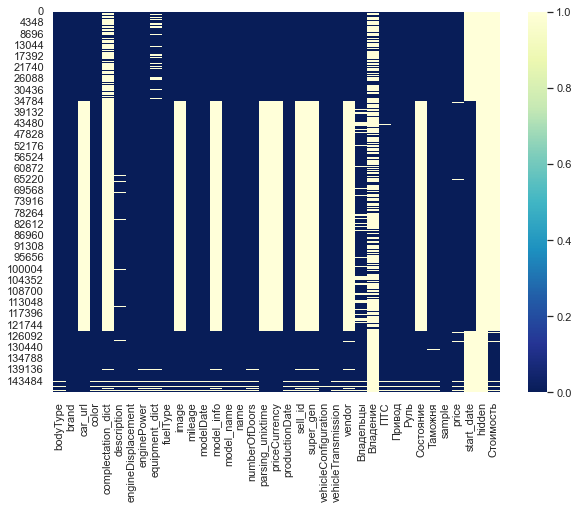

In [39]:
plt.figure(figsize=(10, 7))
sns.heatmap(df.isnull(), cmap="YlGnBu_r");

Посмотрим на количество пропусков у признаков

In [40]:
df.isnull().sum()

bodyType                   619
brand                        0
car_url                  89378
color                      618
complectation_dict      118584
description               4285
engineDisplacement         765
enginePower                939
equipment_dict           10934
fuelType                   764
image                    89997
mileage                    618
modelDate                  619
model_info               90316
model_name                 618
name                       619
numberOfDoors              939
parsing_unixtime         89378
priceCurrency            89378
productionDate             618
sell_id                  90316
super_gen                90317
vehicleConfiguration       463
vehicleTransmission        619
vendor                   90660
Владельцы                14206
Владение                106629
ПТС                        980
Привод                     619
Руль                       618
Состояние                90019
Таможня                    661
sample  

Считаем процент пропусков в столбцах

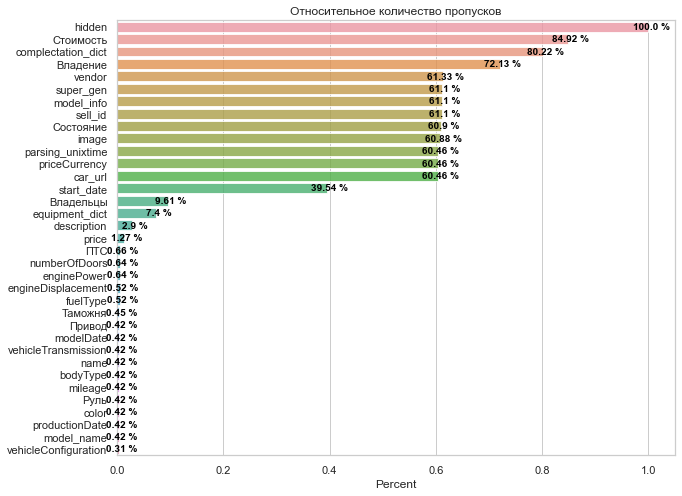

In [41]:
per_nans = pd.DataFrame(1-df.count()/df.shape[0]).reset_index().rename(
    {0:'percent'}, axis=1).sort_values('percent', ascending=False).query('percent>0')
fig, ax = plt.subplots(figsize = (10, 8))
bar_plot = sns.barplot(x='percent', y='index', data=per_nans, alpha=0.8, ci=None)
for ytick in bar_plot.get_yticks():
    bar_plot.text(per_nans.iloc[ytick][1]+0.005, ytick+0.2, str(round(per_nans.iloc[ytick][1]*100,2))+' %',
                  horizontalalignment='center',size=10, color='black',weight='semibold')
plt.title('Относительное количество пропусков')
plt.ylabel('')
plt.xlabel('Percent', fontsize=12)
plt.show()

## Предварительные выводы о датасете df

* В датасете ***df*** 147825 строк, соответствующих 147825 объявлениям.
* Датасет состоит из 37 столбцов: **1** типа **float64** (**parsing_unixtime**) и **34** типа **object**. Из некоторых признаков типа object возможно получится создать новые количественные признаки, поскольку наша ML модель принимает на вход только такие.
* Все признаки содержат пропуски. Необходимо либо обработать пропуски в этих признаках, либо удалить сами признаки.

Как видим, большинство признаков у нас требует очистки и предварительной обработки.

***Информация для парсинга данных***

In [102]:
df_test.brand.unique()

array(['SKODA', 'AUDI', 'HONDA', 'VOLVO', 'BMW', 'NISSAN', 'INFINITI',
       'MERCEDES', 'TOYOTA', 'LEXUS', 'VOLKSWAGEN', 'MITSUBISHI'],
      dtype=object)

AUDI HONDA BMW INFINITI MERCEDES LEXUS SKODA VOLVO NISSAN TOYOTA VOLKSWAGEN MITSUBISHI

In [103]:
df_test.productionDate.min()

1904

In [104]:
df_test.productionDate.max()

2020

### Создадим списки категориальных, количественных признаков, бинарных и признаков для удаления

In [26]:
cat_cols = []
num_cols = []
bin_cols = []
drop_cols = []

### Посмотрим на целевую переменную (price)

In [464]:
df[(df['sample'] == 1)]['price'].isnull().sum()

1877

удалим пропуски

In [465]:
df = df.dropna(subset=['price'])

### Посмотрим на данные с помощью pandas_profiling

In [466]:
# Посмотрим на данные датасета df_test
df_test.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Выводы по profile_report
- **bodyType** - категориальный признак, редкие типы кузова объединим в одну категорию "редкие"
- **brand** - категориальный признак, соединим с моделью - получим новый признак
- **car_url** - неинформативен, на удаление
- **color** - категориальный признак, редкие цвета объединим в одну категорию "редкие"
- **complectation_dict** - много пропусков, возможно можно создать новый признак, дополнив из equipment_dict
- **description** - неинформативен, на удаление
- **engineDisplacement** - преобразовав, получим колличественный признак
- **enginePower** - преобразовав, получим колличественный признак
- **equipment_dict** - смотри выше complectation_dict
- **fuelType** - категориальный признак, последующий OneHotEncoding
- **image** - неинформативен, на удаление
- **mileage** - колличественный признак, есть выбросы, "ноль" - это скорее всего новое авто
- **modelDate** - колличественный признак, сильно коррелирует с productionDate
- **model_info** - дублирует model_name, на удаление
- **model_name** - смотри выше brand
- **name** - пригодится для заполнения пропусков в engineDisplacement и enginePower
- **numberOfDoors** - количество дверей
- **parsing_unixtime** - попытаться привязать к курсу валюты при пересчёте цен
- **priceCurrency** - одно значение, на удаление
- **productionDate** - смотри выше modelDate
- **sell_id** - неинформативен, на удаление
- **super_gen** - из него можно было бы получить несколько новых колличественных признаков, но его нет в train
- **vehicleConfiguration** - признак дублирующий, на удаление
- **vehicleTransmission** - категориальный признак, последующий OneHotEncoding
- **vendor** - категориальный признак, последующий OneHotEncoding
- **Владельцы** - категориальный признак, последующий OneHotEncoding
- **Владение** - неинформативен, на удаление
- **ПТС** - категориальный признак, последующий OneHotEncoding
- **Привод** - категориальный признак, последующий OneHotEncoding
- **Руль** - категориальный признак, последующий OneHotEncoding
- **Состояние** - одно значение, на удаление
- **Таможня** - одно значение, на удаление

## Детальный анализ переменных
### 1. bodyType

In [452]:
df.bodyType.isnull().sum()

1

In [453]:
print('Количество типов кузова в датасете:', df.bodyType.nunique())
df.bodyType.unique()

Количество типов кузова в датасете: 192


array(['лифтбек', 'внедорожник 5 дв.', 'хэтчбек 5 дв.', 'седан',
       'компактвэн', 'универсал 5 дв.', 'пикап одинарная кабина',
       'хэтчбек 3 дв.', 'купе', 'кабриолет', 'минивэн',
       'пикап двойная кабина', 'внедорожник 3 дв.', 'родстер', 'микровэн',
       'седан 2 дв.', 'купе-хардтоп', 'фастбек', 'тарга',
       'внедорожник открытый', 'лимузин', 'пикап полуторная кабина',
       'седан-хардтоп', 'фургон', 'Седан', 'Универсал 5 дв.',
       'Хэтчбек 5 дв. Sportback', 'Хэтчбек 3 дв.', 'Хэтчбек 5 дв.',
       'Кабриолет', 'Купе', 'Лифтбек Sportback', 'Лифтбек', 'Седан Long',
       'Внедорожник 5 дв.', 'Кабриолет Roadster', 'Седан 2 дв.',
       'Седан Gran Coupe', 'Компактвэн', 'Компактвэн Gran Tourer',
       'Лифтбек Gran Turismo', 'Хэтчбек 3 дв. Compact',
       'Лифтбек Gran Coupe', 'Купе-хардтоп', 'Родстер Roadster',
       'Родстер', 'Внедорожник 5 дв. ESV', 'Минивэн',
       'Пикап Двойная кабина', 'Внедорожник 3 дв.',
       'Пикап Одинарная кабина', 'Тарга', 'Пикап

Постараемся объединить имеющиеся типы кузовов в группы

In [454]:
set_bodytype = {'едан':'sedan', 'этчбек':'hatchback', 'дорожник 5 дв':'SUV_5', 'ифтбек':'liftback',
                'абриолет':'cabriolet', 'дорожник 3':'SUV_3', 'икап':'pickup', 'ниверсал':'station_wagon',
                'инивэн':'minivan', 'омпактвэн':'compact_van', 'ожник откр':'SUV_open', 'упе':'coupe',
                'икровэн':'microvan', 'одстер':'roadster', 'ургон':'van', 'арга':'targa', 'музин':'limousine',
                'астбек':'fastback'}

In [455]:
replacement(set_bodytype, df, 'bodyType')
df.bodyType.unique()

array(['liftback', 'SUV_5', 'hatchback', 'sedan', 'compact_van',
       'station_wagon', 'pickup', 'coupe', 'cabriolet', 'minivan',
       'SUV_3', 'roadster', 'microvan', 'fastback', 'targa', 'SUV_open',
       'limousine', 'van', nan], dtype=object)

In [456]:
df[(df['bodyType'].isnull())]

,bodyType,brand,car_url,color,complectation_dict,description,engineDisplacement,enginePower,equipment_dict,fuelType,image,mileage,modelDate,model_info,model_name,name,numberOfDoors,parsing_unixtime,priceCurrency,productionDate,sell_id,super_gen,vehicleConfiguration,vehicleTransmission,vendor,Владельцы,Владение,ПТС,Привод,Руль,Состояние,Таможня,sample,price,start_date,hidden,Стоимость
59310,NaN,HONDA,NaN,CACECB,NaN,"Продаю Honda Civic Suttle 1989 г. выпуска, неу...",NaN,NaN,"{'id': '0', 'name': ''}",универсал,NaN,400000,NaN,NaN,CIVIC,NaN,NaN,NaN,NaN,1989,NaN,NaN,NaN,NaN,NaN,3.0,NaN,ORIGINAL,NaN,LEFT,NaN,True,1,120000.0,2020-04-10T16:07:57Z,NaN,NaN


In [457]:
df = df.dropna(subset=['bodyType'])

Посмотрим на распределение объявлений по типу кузова

<AxesSubplot:title={'center':'Кузов vs Количество объявлений'}>

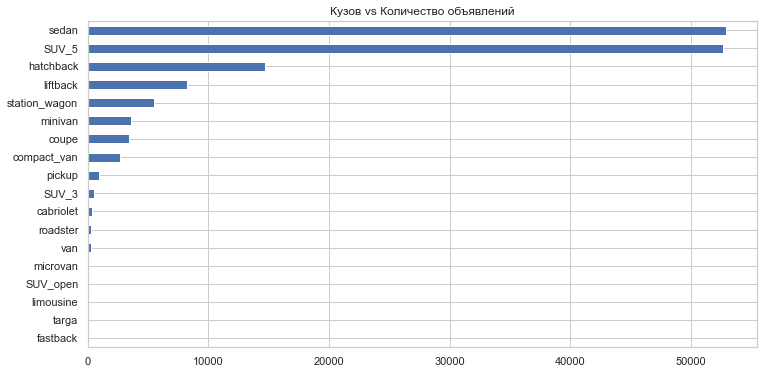

In [458]:
plt.rcParams['figure.figsize'] = (12,6)
df.bodyType.value_counts(ascending=True, dropna=False).plot(kind='barh', title = 'Кузов vs Количество объявлений')

При выборе и оценке стоимости машины тип кузова имеет значение.
Объявим "Редким" тип кузова, который встречается в датасете в менее 3% объявлений

In [36]:
list_of_bodyType = list(df.bodyType.unique())
list_of_rare_bodyType = []
for item in list_of_bodyType:
    if df[(df.bodyType == item)].bodyType.count() <= df.shape[0]*0.03:
        list_of_rare_bodyType.append(item)
df.bodyType = df.bodyType.apply(lambda x: 'rare' if x in list_of_rare_bodyType else x)

Посмотрим, что получилось

<AxesSubplot:title={'center':'Кузов vs Количество объявлений'}>

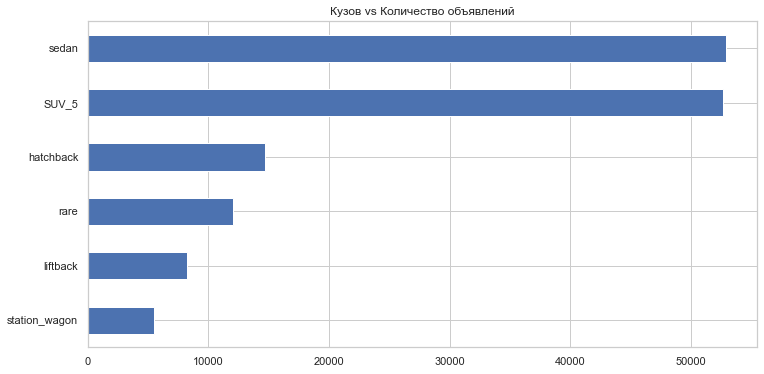

In [57]:
plt.rcParams['figure.figsize'] = (12,6)
df.bodyType.value_counts(ascending=True, dropna=False).plot(kind='barh', title = 'Кузов vs Количество объявлений')

Добавим признак bodyType в списоки

In [37]:
cat_cols.append('bodyType')
drop_cols.append('bodyType')

### 2. brand

В этом признаке нет пропусков
Посмотрим какие значения принимает признак и их количество в датасете df:

In [38]:
print('Количество брендов машин в датасете:', df.brand.nunique())
df.brand.unique()

Количество брендов машин в датасете: 46


array(['SKODA', 'AUDI', 'HONDA', 'VOLVO', 'BMW', 'NISSAN', 'INFINITI',
       'MERCEDES', 'TOYOTA', 'LEXUS', 'VOLKSWAGEN', 'MITSUBISHI',
       'CADILLAC', 'CHERY', 'CHEVROLET', 'CHRYSLER', 'CITROEN', 'DAEWOO',
       'DODGE', 'FORD', 'GEELY', 'HYUNDAI', 'JAGUAR', 'JEEP', 'KIA',
       'MAZDA', 'MINI', 'OPEL', 'PEUGEOT', 'PORSCHE', 'RENAULT', 'SUBARU',
       'SUZUKI', 'GREAT_WALL', 'LAND_ROVER', 'SSANG_YONG', 'audi', 'bmw',
       'honda', 'infiniti', 'mercedes', 'lexus', 'skoda', 'volvo',
       'nissan', 'chery'], dtype=object)

Мы видим, что одни и те же бренды записаны в разном регистре, исправим это:

In [39]:
df.brand = df.brand.str.lower()
print('Количество брендов машин в датасете:', df.brand.nunique())
df.brand.unique()

Количество брендов машин в датасете: 36


array(['skoda', 'audi', 'honda', 'volvo', 'bmw', 'nissan', 'infiniti',
       'mercedes', 'toyota', 'lexus', 'volkswagen', 'mitsubishi',
       'cadillac', 'chery', 'chevrolet', 'chrysler', 'citroen', 'daewoo',
       'dodge', 'ford', 'geely', 'hyundai', 'jaguar', 'jeep', 'kia',
       'mazda', 'mini', 'opel', 'peugeot', 'porsche', 'renault', 'subaru',
       'suzuki', 'great_wall', 'land_rover', 'ssang_yong'], dtype=object)

Посмотрим на распределение объявлений по brand

<AxesSubplot:title={'center':'Бренд vs Количество объявлений'}>

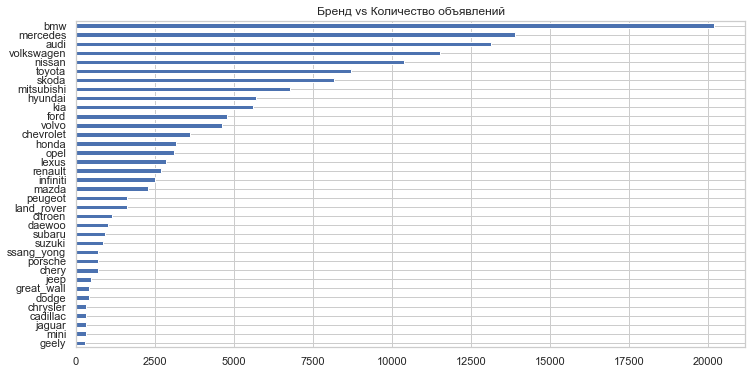

In [61]:
plt.rcParams['figure.figsize'] = (12,6)
df.brand.value_counts(ascending=True, dropna=False).plot(kind='barh', title = 'Бренд vs Количество объявлений')

Добавим признак brand в списоки

In [40]:
cat_cols.append('brand')
drop_cols.append('brand')

### 3. car_url

In [41]:
df.car_url[0]

'https://auto.ru/cars/used/sale/skoda/octavia/1100575026-c780dc09/'

Это ссылка на страницу с объявлением. Для последующего предсказания стоимости авто этот признак неинформативен
Добавим признак car_url в список drop_cols:

In [42]:
drop_cols.append('car_url')

### 4. color

In [43]:
df.color.unique()

array(['синий', 'чёрный', 'серый', 'коричневый', 'белый', 'пурпурный',
       'бежевый', 'серебристый', 'красный', 'зелёный', 'жёлтый',
       'голубой', 'оранжевый', 'фиолетовый', 'золотистый', 'розовый',
       '040001', 'EE1D19', '0000CC', 'CACECB', '007F00', 'FAFBFB',
       '97948F', '22A0F8', '660099', '200204', 'C49648', 'DEA522',
       '4A2197', 'FFD600', 'FF8649', 'FFC0CB'], dtype=object)

Посмотрим пропуски

In [44]:
df.color.isnull().sum()

0

Постараемся объединить имеющиеся цвета:

In [45]:
set_colors = {'FFC0CB':'pink', 'розовый':'pink', 'синий':'blue', 'чёрный':'black', 'серый':'gray',
              'коричневый':'brown', 'белый':'white', 'пурпурный':'purple', 'бежевый':'beige',
              'серебристый':'silver', 'красный':'red', 'зелёный':'green', 'жёлтый':'yellow',
              'голубой':'blue', 'оранжевый':'orange', 'фиолетовый':'purple', 'золотистый':'gold',
              '040001':'red', 'EE1D19':'red', '0000CC':'blue', 'CACECB':'gray', '007F00':'green',
              'FAFBFB':'blue', '97948F':'gray', '22A0F8':'blue', '660099':'purple', '200204':'purple',
              'C49648':'brown', 'DEA522':'brown', '4A2197':'purple', 'FFD600':'yellow', 'FF8649':'coral',
              'FFC0CB':'pink'}

In [46]:
replacement_1(set_colors, df, 'color')

Посмотрим, что получилось

In [47]:
df.color.value_counts(dropna=False)

blue      32512
red       32039
gray      29243
black     18465
white     10770
purple     5588
silver     5230
brown      5174
green      3859
yellow      966
beige       925
coral       515
gold        338
orange      277
pink         46
Name: color, dtype: int64

Объявим редким цвет, который встречается в датасете в менее 5% объявлений

In [48]:
list_of_colors = list(df.color.unique())
list_of_rare_colors = []
for item in list_of_colors:
    if df[(df.color == item)].color.count() <= df.shape[0]*0.05:
        list_of_rare_colors.append(item)
df.color = df.color.apply(lambda x: 'rare' if x in list_of_rare_colors else x)

Посмотрим, что получилось

<AxesSubplot:title={'center':'Цвет машины vs Количество объявлений'}>

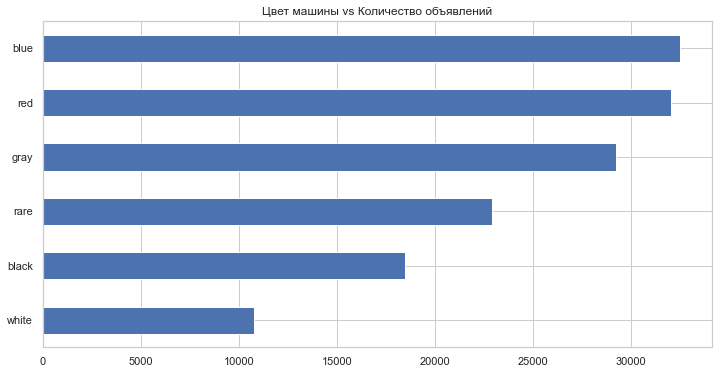

In [71]:
plt.rcParams['figure.figsize'] = (12,6)
df.color.value_counts(ascending=True, dropna=False).plot(kind='barh', title = 'Цвет машины vs Количество объявлений')

Добавим признак color в списоки

In [49]:
cat_cols.append('color')
drop_cols.append('color')

### 5. complectation_dict

In [50]:
df.complectation_dict[5]

'{"id":"5011515","name":"RS","available_options":["cruise-control","sport-seats","multi-wheel","airbag-passenger","lock","electro-mirrors","mirrors-heat","cooling-box","computer","seat-transformation","wheel-power","fabric-seats","airbag-side","abs","wheel-leather","climate-control-1","esp","audiopreparation","electro-window-back","condition","music-super","park-assist-r","airbag-driver","isofix","aux","electro-window-front","light-sensor","alarm","paint-metallic","ptf","rain-sensor","tyre-pressure","audiosystem-cd","front-seats-heat","wheel-configuration2","wheel-configuration1","immo"]}'

In [74]:
df.complectation_dict = df.complectation_dict.apply(dict_to_list)
df.complectation_dict[5]

['cruise-control',
 'sport-seats',
 'multi-wheel',
 'airbag-passenger',
 'lock',
 'electro-mirrors',
 'mirrors-heat',
 'cooling-box',
 'computer',
 'seat-transformation',
 'wheel-power',
 'fabric-seats',
 'airbag-side',
 'abs',
 'wheel-leather',
 'climate-control-1',
 'esp',
 'audiopreparation',
 'electro-window-back',
 'condition',
 'music-super',
 'park-assist-r',
 'airbag-driver',
 'isofix',
 'aux',
 'electro-window-front',
 'light-sensor',
 'alarm',
 'paint-metallic',
 'ptf',
 'rain-sensor',
 'tyre-pressure',
 'audiosystem-cd',
 'front-seats-heat',
 'wheel-configuration2',
 'wheel-configuration1',
 'immo']

Посмотрим общее колличество уникальных элементов

In [75]:
df.complectation_dict.explode().nunique()

367

Признак complectation_dict имеет 80.22% пропусков, но информация о комплектации содержится
ещё в одном признаке - в 'equipment_dict', возможно, они дополнят друг друга!
Добавим его в список drop_cols:

In [51]:
drop_cols.append('complectation_dict')

### 6. description

In [77]:
df.description[0]

'Все автомобили, представленные в продаже, проходят тщательную проверку по более 40 параметрам. Предоставляем гарантию юридической чистоты, а так же год технической гарантии на двигатель и КПП. Бесплатный тест-драйв. Возможно оформление автомобиля в кредит!\n\nПреимущества автокредитования:\n— Первоначальный взнос от 0%;\n— Более 30 кредитных программ;\n— Процентная ставка от 6% годовых;\n— Срок кредита от 6 месяцев до 7 лет;\n— Оформление кредита по двум документам;\n— Досрочное погашение без штрафов и комиссий;\n— Сумма кредита до 2 млн рублей;\n— Оформление КАСКО – по желанию;\n— Без справок и поручителей.\n\nСотрудничаем с 12 аккредитованными и сертифицированными банками РФ, среднее время ожидания решения банка 20–30 минут.\n\nПри покупке автомобиля по программе «Trade-in – выгодный обмен» или в кредит, получите дополнительную скидку до 80 000 рублей на данный автомобиль!\n\nЗаписаться на тест-драйв, а так же получить подробную информацию можно у специалистов автоцентра по указанно

In [78]:
df.description.isnull().sum()

3644

Для последующего предсказания стоимости авто этот признак неинформативен
Добавим признак description в список drop_cols:

In [52]:
drop_cols.append('description')

### 7. engineDisplacement

Признак engineDisplacement показывает, какой объём двигателя у продаваемой машины

In [53]:
df.engineDisplacement.unique()

array(['1.2 LTR', '1.6 LTR', '1.8 LTR', ..., '4.4 л / 635 л.с. /',
       '3.4 л / 192 л.с. /', '4.4 л / 462 л.с. /'], dtype=object)

Количество пропусков

In [54]:
len(df.loc[(df.engineDisplacement.isnull())])

145

При осмотре признаков выяснилось, что в признаке 'name' есть технические характеристики автомобиля, в том числе информация об объёме двигателя

In [55]:
df.loc[(df.engineDisplacement.isnull())]['name'].unique()

array(['50 Electro AT (220 кВт) 4WD', 'Electro AT (370 кВт) 4WD',
       '55 Electro AT (300 кВт) 4WD', '50 Electro AT (230 кВт) 4WD',
       'Electro AT (390 кВт) 4WD', 'Electro AT (475 кВт) 4WD',
       '94Ah Electro AT (125 кВт)', '94Ah S Electro AT (135 кВт)',
       'xDrive40 Electro AT (240 кВт) 4WD',
       '120Ah S Electro AT (135 кВт)', '60Ah Electro AT (125 кВт)',
       '120Ah Electro AT (125 кВт)', 'Electro AT (113 кВт)',
       '300 Extra-long Electro AT (150 кВт)',
       '300 Long Electro AT (150 кВт)', 'Electro AT (80 кВт)'],
      dtype=object)

In [56]:
df.engineDisplacement = df.engineDisplacement.apply(engine_displacement)

Смотрим, что получилось

In [57]:
df['engineDisplacement'].unique()

array([1.2, 1.6, 1.8, 2. , 1.4, 1.3, 1. , 3.6, 1.5, 1.9, 2.8, 1.1, 2.5,
       4.2, 3. , 4. , 5.9, 2.7, 3.1, 2.4, 5.2, 3.2, 4.1, 6.3, 2.3, 6. ,
       2.2, 3.7, 2.9, 5. , 3.3, 2.1, 2.6, 0. , 3.5, 1.7, 0.7, 4.4, 4.8,
       5.4, 6.6, 4.9, 3.8, 3.4, 3.9, 4.6, 5.6, 4.5, 5.5, 6.2, 4.7, 4.3,
       5.8, 5.3, 5.7, 6.4, 8.2, 7. , 0.8, 8.1, 7.5, 7.4, 6.5, 6.8, 6.7,
       7.3, nan])

Сделаем замену в пропусков в engineDisplacement значением 0, поскольку,
как видно из признака name, это электромобили, и они имеют нулевой объём двигателя

In [58]:
df.engineDisplacement = df.engineDisplacement.fillna(0)

<Figure size 864x432 with 0 Axes>

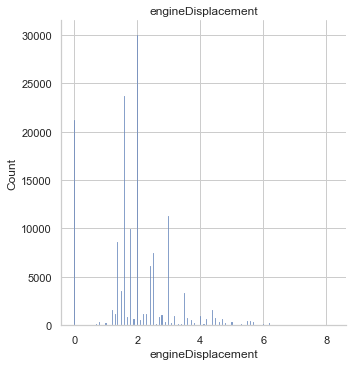

In [86]:
plt.figure()
sns.displot(df['engineDisplacement'], kde = False, rug=False)
plt.title('engineDisplacement')
plt.show()

Посмотрим на выбросы

In [59]:
IQR_outlier(df, 'engineDisplacement', verbose=True)

Для признака engineDisplacement :
25-й перцентиль: 1.5 75-й перцентиль: 2.4, IQR: 0.8999999999999999,  Границы выбросов: [0.15000000000000013, 3.75].
Выбросов, согласно IQR: 28899 | 19.80%


***В последующем мы прологарифмируем числовые переменные, чтобы сгладить разницу в размерности и уменьшить выбросы***
Добавим признак engineDisplacement в список num_cols:

In [60]:
num_cols.append('engineDisplacement')

### 8. enginePower

In [61]:
df.enginePower.unique()

array(['105 N12', '110 N12', '152 N12', '200 N12', '102 N12', '150 N12',
       '90 N12', '180 N12', '220 N12', '122 N12', '70 N12', '140 N12',
       '125 N12', '54 N12', '86 N12', '75 N12', '64 N12', '95 N12',
       '260 N12', '170 N12', '80 N12', '68 N12', '160 N12', '115 N12',
       '280 N12', '53 N12', '60 N12', '143 N12', '42 N12', '101 N12',
       '58 N12', '193 N12', '79 N12', '30 N12', '100 N12', '50 N12',
       '163 N12', '225 N12', '420 N12', '211 N12', '245 N12', '560 N12',
       '500 N12', '249 N12', '450 N12', '605 N12', '250 N12', '354 N12',
       '120 N12', '290 N12', '230 N12', '350 N12', '204 N12', '255 N12',
       '340 N12', '177 N12', '272 N12', '372 N12', '210 N12', '130 N12',
       '300 N12', '190 N12', '239 N12', '435 N12', '333 N12', '271 N12',
       '326 N12', '238 N12', '310 N12', '233 N12', '252 N12', '133 N12',
       '460 N12', '520 N12', '400 N12', '525 N12', '367 N12', '265 N12',
       '550 N12', '580 N12', '88 N12', '165 N12', '430 N12', '335 N

Посчитаем, сколько пропусков

In [62]:
df.enginePower.isnull().sum()

311

Признак enginePower показывает, какая мощность двигателя у продаваемой машины
Переведем его из формата object в формат float

In [63]:
df.enginePower = df.enginePower.apply(enginePower)

Заполним пропуски данными из признака 'name'

In [64]:
df[(df.enginePower.isnull())]['name'].unique()

array(['2.0 AT (249 л.с.) 4WD', '1.5 CVT (147 л.с.)', '1.3 MT (83 л.с.)',
       '1.5 CVT (113 л.с.)', '1.9 MT (132 л.с.)', '2.0 CVT (170 л.с.)',
       '1.6 MT (88 л.с.)', '2.0 MT (136 л.с.)', '1.5 MT (109 л.с.)',
       '2.0 CVT (139 л.с.)', '1.3 AMT (83 л.с.)', '1.6 AMT (186 л.с.)',
       '1.6 CVT (126 л.с.)', '2.0 MT (130 л.с.)', '2.4 MT (129 л.с.)',
       '1.9 AMT (132 л.с.)', '1.6 MT (126 л.с.)', '1.6 MT (119 л.с.)',
       '1.5 MT (106 л.с.)', '1.5 AMT (147 л.с.)', '2.0 CVT (122 л.с.)',
       '0.8 MT (52 л.с.)', '2.0 CVT (136 л.с.)', '2.0 AT (125 л.с.)',
       '1.1 MT (68 л.с.)', '2.0 AT (136 л.с.)', '2.4 MT (129 л.с.) 4WD',
       '0.8 AMT (52 л.с.)', '1.6 MT (94 л.с.)', '1.8 AT (132 л.с.)',
       '20d xDrive 2.0d AT (190 л.с.) 4WD', '30d 3.0d AT (245 л.с.) 4WD',
       '30d 3.0d AT (249 л.с.) 4WD', '530d xDrive 3.0d AT (249 л.с.) 4WD',
       '30d xDrive 3.0d AT (249 л.с.) 4WD', '35i 3.0 AT (306 л.с.) 4WD',
       '25d 3.0d AT (218 л.с.) 4WD', '118i 1.6 AT (170 л.с.)',
  

In [65]:
df_2 = df.loc[df.enginePower.isnull()].copy()

In [66]:
df_2.enginePower = df_2.name.apply(enginePower_nan)

In [67]:
df.loc[df.enginePower.isnull()] = df_2.copy()

<Figure size 864x432 with 0 Axes>

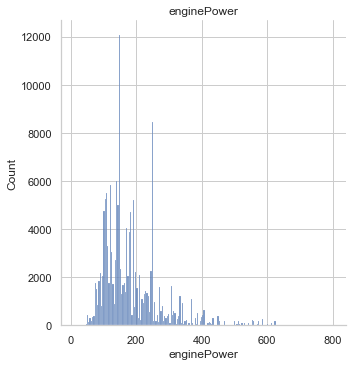

In [96]:
plt.figure()
sns.displot(df['enginePower'], kde = False, rug=False)
plt.title('enginePower')
plt.show()

Посмотрим на выбросы

In [70]:
IQR_outlier(df, 'enginePower', verbose=True)

Для признака enginePower :
25-й перцентиль: 122.0 75-й перцентиль: 224.0, IQR: 102.0,  Границы выбросов: [-31.0, 377.0].
Выбросов, согласно IQR: 6122 | 4.19%


Выбросов немного, и, скорее всего, это не ошибочные значения. Мы потом сгладим разницу в значениях **логарифмированием**
Посмотрим на авто с максимальной мощностью двигателя:

In [71]:
df[(df.enginePower==df.enginePower.max())]

,bodyType,brand,car_url,color,complectation_dict,description,engineDisplacement,enginePower,equipment_dict,fuelType,image,mileage,modelDate,model_info,model_name,name,numberOfDoors,parsing_unixtime,priceCurrency,productionDate,sell_id,super_gen,vehicleConfiguration,vehicleTransmission,vendor,Владельцы,Владение,ПТС,Привод,Руль,Состояние,Таможня,sample,price,start_date,hidden,Стоимость
118662,SUV_5,mercedes,NaN,red,NaN,BRABUS G800 WIDESTAR на базе G63\n800 л.с.\n\n...,0.0,800.0,"{'id': '21715492', 'name': 'Individual', 'avai...",бензин,NaN,0,2018.0,NaN,G_KLASSE_AMG,Brabus 800 4.0 AT (800 л.с.) 4WD,5.0,NaN,NaN,2020,NaN,NaN,ALLROAD_5_DOORS AUTOMATIC Brabus,AUTOMATIC,NaN,NaN,NaN,NaN,полный,LEFT,NaN,True,1,31600000.0,2020-04-04T15:24:25Z,NaN,NaN


Действительно такая мощность двигателя существует
Добавим признак enginePower в список num_cols:

In [72]:
num_cols.append('enginePower')

### 9. equipment_dict

- Признак имеет пропуски - 10934 (7.4%). Большинство этих пропусков находится в нашем датасете test (до 26%) Посмотрим, возможно объединение признака equipment_dict и complectation_dict

In [100]:
df.equipment_dict[100]

'{"cruise-control":true,"engine-proof":true,"asr":true,"tinted-glass":true,"esp":true,"airbag-driver":true,"usb":true,"aux":true,"electro-window-front":true,"light-sensor":true,"multi-wheel":true,"airbag-curtain":true,"ashtray-and-cigarette-lighter":true,"airbag-passenger":true,"high-beam-assist":true,"computer":true,"roof-rails":true,"seat-transformation":true,"wheel-power":true,"alarm":true,"lock":true,"fabric-seats":true,"electro-mirrors":true,"airbag-rear-side":true,"electro-window-back":true,"alloy-wheel-disks":true,"leather-gear-stick":true,"16-inch-wheels":true,"ptf":true,"rain-sensor":true,"airbag-side":true,"mirrors-heat":true,"dark-interior":true,"audiosystem-cd":true,"abs":true,"front-seats-heat":true,"power-child-locks-rear-doors":true,"bluetooth":true,"wheel-leather":true,"wheel-configuration2":true,"wheel-configuration1":true,"immo":true,"windscreen-heat":true,"climate-control-2":true,"park-assist-r":true,"12v-socket":true,"knee-airbag":true}'

In [101]:
df.equipment_dict.isnull().sum()

10307

In [102]:
df.equipment_dict = df.equipment_dict.apply(equipment_dict_to_list)
df.equipment_dict[100]

['cruise-control',
 'engine-proof',
 'asr',
 'tinted-glass',
 'esp',
 'airbag-driver',
 'usb',
 'aux',
 'electro-window-front',
 'light-sensor',
 'multi-wheel',
 'airbag-curtain',
 'ashtray-and-cigarette-lighter',
 'airbag-passenger',
 'high-beam-assist',
 'computer',
 'roof-rails',
 'seat-transformation',
 'wheel-power',
 'alarm',
 'lock',
 'fabric-seats',
 'electro-mirrors',
 'airbag-rear-side',
 'electro-window-back',
 'alloy-wheel-disks',
 'leather-gear-stick',
 '16-inch-wheels',
 'ptf',
 'rain-sensor',
 'airbag-side',
 'mirrors-heat',
 'dark-interior',
 'audiosystem-cd',
 'abs',
 'front-seats-heat',
 'power-child-locks-rear-doors',
 'bluetooth',
 'wheel-leather',
 'wheel-configuration2',
 'wheel-configuration1',
 'immo',
 'windscreen-heat',
 'climate-control-2',
 'park-assist-r',
 '12v-socket',
 'knee-airbag']

Общее колличество уникальных элементов

In [103]:
df.equipment_dict.explode().nunique()

296

Создадим новый признак, объединив equipment_dict и complectation_dict

In [104]:
df_tmp = df.apply(complectation_new, axis=1)

Поспотрим на оставшиеся пропуски.

In [105]:
df_tmp[df_tmp.complectation_new == 'not known']

,bodyType,brand,car_url,color,complectation_dict,description,engineDisplacement,enginePower,equipment_dict,fuelType,image,mileage,modelDate,model_info,model_name,name,numberOfDoors,parsing_unixtime,priceCurrency,productionDate,sell_id,super_gen,vehicleConfiguration,vehicleTransmission,vendor,Владельцы,Владение,ПТС,Привод,Руль,Состояние,Таможня,sample,price,start_date,hidden,Стоимость,complectation_new
58,liftback,skoda,https://auto.ru/cars/used/sale/skoda/octavia/1...,white,{},Срочно Продам.,1.6,110.0,{},бензин,https://autoru.naydex.net/o9DBXQ270/5ac010hAY0...,150200,2013.0,"{""code"":""OCTAVIA"",""name"":""Octavia"",""ru_name"":""...",OCTAVIA,1.6 MT (110 л.с.),5.0,1.603227e+09,RUB,2016,1101316944.0,"{""id"":""20105520"",""displacement"":1598,""engine_t...",LIFTBACK MECHANICAL 1.6,механическая,EUROPEAN,3 или более,NaN,Дубликат,передний,Левый,Не требует ремонта,Растаможен,0,0.0,NaN,NaN,NaN,not known
81,liftback,skoda,https://auto.ru/cars/used/sale/skoda/octavia/1...,black,{},"Хорошее состояние , бережная эксплуатация, 2...",1.8,152.0,{},бензин,https://avatars.mds.yandex.net/get-autoru-vos/...,229300,2008.0,"{""code"":""OCTAVIA"",""name"":""Octavia"",""ru_name"":""...",OCTAVIA,1.8 AT (152 л.с.),5.0,1.603227e+09,RUB,2013,1101318094.0,"{""id"":""4561004"",""displacement"":1798,""engine_ty...",LIFTBACK AUTOMATIC 1.8,автоматическая,EUROPEAN,2 владельца,NaN,Оригинал,передний,Левый,Не требует ремонта,Растаможен,0,0.0,NaN,NaN,NaN,not known
85,liftback,skoda,https://auto.ru/cars/used/sale/skoda/octavia/1...,white,{},"Все автомобили, для Вашего удобства, находятся...",1.2,105.0,{},бензин,https://avatars.mds.yandex.net/get-autoru-vos/...,96000,2013.0,"{""code"":""OCTAVIA"",""name"":""Octavia"",""ru_name"":""...",OCTAVIA,1.2 MT (105 л.с.),5.0,1.603227e+09,RUB,2014,1101315490.0,"{""id"":""10373604"",""displacement"":1197,""engine_t...",LIFTBACK MECHANICAL 1.2,механическая,EUROPEAN,1 владелец,NaN,Оригинал,передний,Левый,Не требует ремонта,Растаможен,0,0.0,NaN,NaN,NaN,not known
90,hatchback,skoda,https://auto.ru/cars/used/sale/skoda/fabia/110...,gray,{},"Все автомобили, для Вашего удобства, находятся...",1.6,105.0,{},бензин,https://autoru.naydex.net/o9DBXQ270/5ac010hAY0...,152000,2010.0,"{""code"":""FABIA"",""name"":""Fabia"",""ru_name"":""Фаби...",FABIA,1.6 AT (105 л.с.),5.0,1.603227e+09,RUB,2011,1101313536.0,"{""id"":""6225863"",""displacement"":1598,""engine_ty...",HATCHBACK_5_DOORS AUTOMATIC 1.6,автоматическая,EUROPEAN,1 владелец,NaN,Оригинал,передний,Левый,Не требует ремонта,Растаможен,0,0.0,NaN,NaN,NaN,not known
99,liftback,skoda,https://auto.ru/cars/used/sale/skoda/superb/11...,blue,{},Вашему вниманию представляется автомобиль Skod...,1.4,150.0,{},бензин,https://avatars.mds.yandex.net/get-autoru-vos/...,64704,2015.0,"{""code"":""SUPERB"",""name"":""Superb"",""ru_name"":""Су...",SUPERB,1.4 AMT (150 л.с.),5.0,1.603227e+09,RUB,2018,1101313226.0,"{""id"":""20696893"",""displacement"":1395,""engine_t...",LIFTBACK ROBOT 1.4,роботизированная,EUROPEAN,2 владельца,NaN,Дубликат,передний,Левый,Не требует ремонта,Растаможен,0,0.0,NaN,NaN,NaN,not known
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147820,SUV_5,bmw,https://auto.ru/cars/used/sale/bmw/x3/11062041...,white,{},По технике в идеале. Мотор масло не ест совсем...,3.0,249.0,{},Дизель,[https://avatars.mds.yandex.net/get-autoru-vos...,198000,2012,None,BMW,30d xDrive 3.0d AT (249 л.с.) 4WD,None,1.645704e+09,ruble,2012,None,None,,автоматическая,None,2 владельца,NaN,Оригинал,полный,Левый,Не требует ремонта,Растаможен,1,1800000,NaN,NaN,1 800 000 ₽,not known
147821,SUV_5,bmw,https://auto.ru/cars/used/sale/bmw/x3/11062801...,blue,{},"Все автомобили, для Вашего удобства, находятся...",2.0,184.0,{},Бензин,[https://avatars.mds.yandex.net/get-autoru-vos...,60970,2018,None,BMW,20i xDrive 2.0 AT (184 л.с.) 4WD,None,1.645704e+09,ruble,2018,None,None,,автоматическая,None,1 владелец,NaN,Оригинал,полн

пропусков осталось много.
Добавим признак equipment_dict в список drop_cols

In [73]:
drop_cols.append('equipment_dict')

### 10.fuelType

Посмотрим какие значения принимает признак и их количество в датасете df

In [74]:
print('Количество типов топлива в датасете:', df.fuelType.nunique())
df.fuelType.value_counts(dropna=False)

Количество типов топлива в датасете: 9


бензин                                103311
дизель                                 19641
Бензин                                 16056
Дизель                                  5872
гибрид                                   517
электро                                  166
NaN                                      145
Гибрид                                   141
Бензин, газобаллонное оборудование        80
газ                                       18
Name: fuelType, dtype: int64

Мы видим, что один и тот же тип топлива записан в разных регистрах, исправим это:

In [75]:
df.fuelType = df.fuelType.str.lower()

In [76]:
set_fuel = {'бензин':'petrol', 'дизель':'diesel', 'гибрид':'hybrid', 'электро':'electro', 'газ':'gas',
            'бензин, газобаллонное оборудование':'gbo'}

In [77]:
replacement_1(set_fuel, df, 'fuelType')

In [78]:
df.fuelType.unique()

array(['petrol', 'diesel', 'hybrid', 'electro', 'gas', None, 'gbo'],
      dtype=object)

In [79]:
df[(df['fuelType'].isnull())]['name']

124079          50 Electro AT (220 кВт) 4WD
124082          50 Electro AT (220 кВт) 4WD
124266             Electro AT (370 кВт) 4WD
124323          50 Electro AT (220 кВт) 4WD
124325          55 Electro AT (300 кВт) 4WD
                        ...                
147457           120Ah Electro AT (125 кВт)
147490    xDrive40 Electro AT (240 кВт) 4WD
147547    xDrive40 Electro AT (240 кВт) 4WD
147603    xDrive40 Electro AT (240 кВт) 4WD
147624           120Ah Electro AT (125 кВт)
Name: name, Length: 145, dtype: object

Мы видим, что в признаке name есть данные о том,
какой тип двигателя у нас, из чего мы можем сделать выводы о типе топлива

In [80]:
df_ft = df.loc[df.fuelType.isnull()].copy()
df_ft.fuelType= df_ft.name.apply(lambda x: 'electro')
df.loc[df.fuelType.isnull()] = df_ft.copy()

Посмотрим сейчас на пропуски

In [81]:
df.fuelType.isnull().sum()

0

Посмотрим, что получилось

<AxesSubplot:title={'center':'Тип топлива vs Количество объявлений'}>

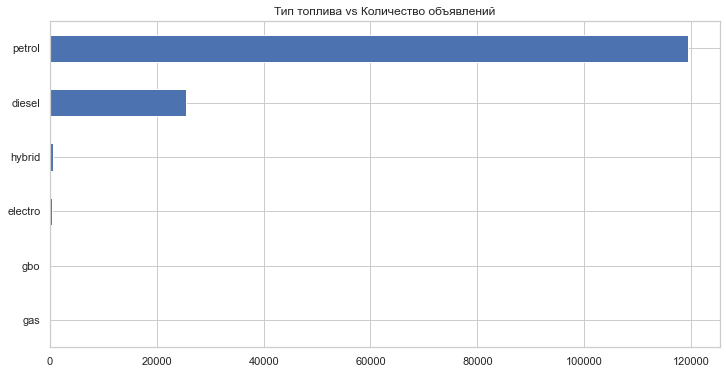

In [115]:
plt.rcParams['figure.figsize'] = (12,6)
df.fuelType.value_counts(ascending=True, dropna=False).plot(kind='barh', title = 'Тип топлива vs Количество объявлений')

Добавим признак fuelType в списоки

In [82]:
cat_cols.append('fuelType')
drop_cols.append('fuelType')

### 11.image

In [83]:
df.image[0]

'https://autoru.naydex.net/o9DBXQ270/5ac010hAY0/Xkcrbmf2u0IghxJHqVi5dGL7OcugpPbM0sYLDhB9YWw7CxRKU17ysuJYxu9oaUHn7ahNSrqiKwm-CQDyDolDeEoEc3J49fgWYNYBUbQC7D96sj6K9_O-mo6XT34oWVQDBTEybGZikaX4X4bwLyUujf_KICqw3ygs2UNJlXu4Og#DSD'

Тестовая выборка была получена в 2020 году, поэтому информация о фото с сайта скорее всего неактувльна
Добавим признак image в список drop_cols:

In [84]:
drop_cols.append('image')

### 12. mileage

In [85]:
df.mileage.isnull().sum()

0

Признак **mileage** не имеет пропусков

In [86]:
df.mileage.unique()

array([74000, 60563, 88000, ..., '125803', '136900', '82400'],
      dtype=object)

In [88]:
df.mileage = df.mileage.apply(lambda x: float(x))

In [90]:
plt.figure()
sns.displot(df['mileage'], kde = False, rug=False)
plt.title('mileage')
plt.show()

Посмотрим на выбросы

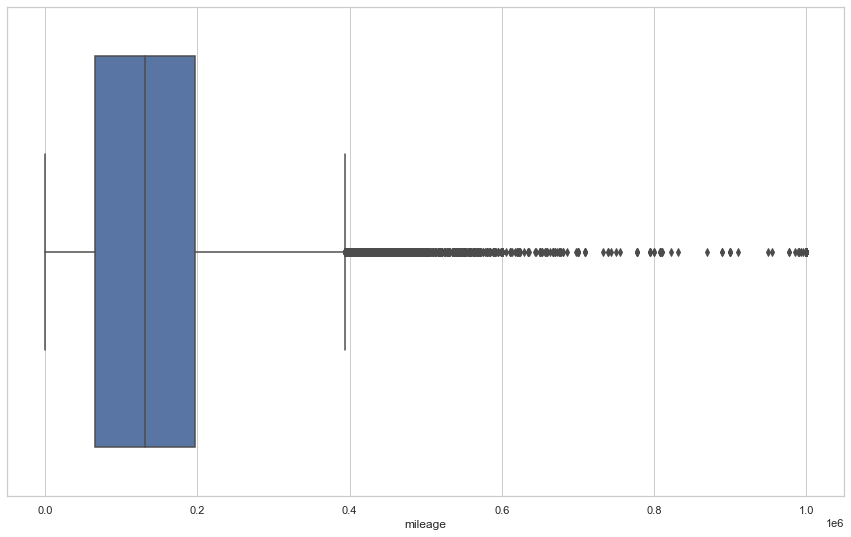

Для признака mileage :
25-й перцентиль: 66000.0 75-й перцентиль: 197000.0, IQR: 131000.0,  Границы выбросов: [-130500.0, 393500.0].
Выбросов, согласно IQR: 2678 | 1.83%


In [123]:
plt.figure(figsize=(15, 9))
sns.boxplot(data=df, x='mileage')
plt.show()
IQR_outlier(df, 'mileage', verbose=True)

Посмотрим на авто с максимальным пробегом и их количество:

In [91]:
print('Количество машин с пробегом 1000000 км:', len(df[(df.mileage == df.mileage.max())]))
df.mileage.max()

Количество машин с пробегом 1000000 км: 29


1000000.0

Это, в основном, старые автомобили, у которых пробег, наверняка, на счётчике одометра достиг максимума (максимум одометра это 999999 км). В последующем мы **прологорифмируем** признак, постараясь уменьшить выбросы и сгладить разброс в размерности количесивенных признакоы

Добавим признак mileage в список num_cols:

In [92]:
num_cols.append('mileage')

### 13.modelDate

In [93]:
df.modelDate.unique()

array([2013.0, 2017.0, 2008.0, 2009.0, 2016.0, 2012.0, 2015.0, 2010.0,
       2006.0, 2000.0, 2007.0, 1994.0, 2004.0, 1999.0, 2005.0, 1976.0,
       2001.0, 1969.0, 1996.0, 1998.0, 1989.0, 1934.0, 2014.0, 2011.0,
       2018.0, 1986.0, 1997.0, 1990.0, 2019.0, 2002.0, 1991.0, 1987.0,
       1980.0, 1982.0, 1938.0, 1988.0, 2003.0, 1983.0, 1978.0, 1979.0,
       1984.0, 1992.0, 1995.0, 1993.0, 1985.0, 1974.0, 1966.0, 1977.0,
       1981.0, 1972.0, 1968.0, 1975.0, 1949.0, 1937.0, 1936.0, 1973.0,
       1959.0, 1958.0, 2020.0, 1965.0, 1971.0, 1904.0, 1963.0, 1955.0,
       1951.0, 1960.0, 1956.0, 1970.0, 1964.0, 1957.0, 1927.0, 1908.0,
       1932.0, 1935.0, 1967.0, 1948.0, 1950.0, 1961.0, '2012', '2018',
       '2013', '2011', '2008', '2014', '2019', '2021', '2007', '2016',
       '2009', '2004', '2010', '2020', '2015', '2017', '1994', '2003',
       '1998', '2006', '2000', '1990', '2005', '1996', '2001', '1991',
       '1988', '1995', '1993', '1989', '2002', '2022', '1999', '1997',
      

In [94]:
df.modelDate.isnull().sum()

0

In [95]:
df.modelDate = df.modelDate.apply(model_date)

In [96]:
df.modelDate.value_counts()

2010    9193
2006    8591
2017    8410
2009    8347
2011    8169
        ... 
1908       2
1967       1
1948       1
1946       1
1935       1
Name: modelDate, Length: 82, dtype: int64

<Figure size 864x432 with 0 Axes>

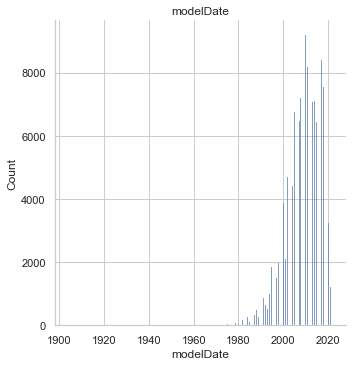

In [130]:
plt.figure()
sns.displot(df['modelDate'], kde = False, rug=False)
plt.title('modelDate')
plt.show()

Посмотрим на выбросы:

In [97]:
IQR_outlier(df, 'modelDate', verbose=True)

Для признака modelDate :
25-й перцентиль: 2005.0 75-й перцентиль: 2014.0, IQR: 9.0,  Границы выбросов: [1991.5, 2027.5].
Выбросов, согласно IQR: 4154 | 2.85%


Судя по всему, все выбросы у нижней границы. Посмотрим какого года самое старое авто у каждого бренда:

(1880.0, 2020.0)

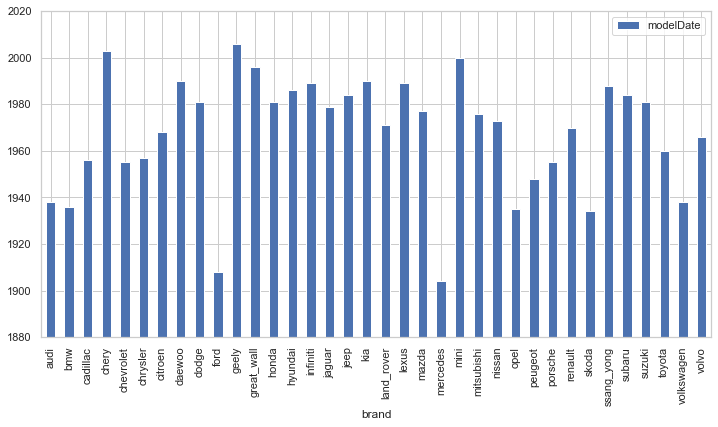

In [132]:
df.pivot_table(values = ['modelDate'],
               index = 'brand',
               aggfunc = 'min').plot(kind = 'bar')
plt.ylim([1880, 2020])

**Вывод:** Это просто действительно старые авто, и мы уменьшим разброс данных последующим **логарифмированием**
Добавим признак modelDate в список num_cols:

In [98]:
num_cols.append('modelDate')

### 14.model_info

In [99]:
df.model_info[0]

'{"code":"OCTAVIA","name":"Octavia","ru_name":"Октавия","morphology":{"gender":"FEMININE"},"nameplate":{"code":"","name":"","semantic_url":""}}'

Опережая события, скажем, что признак **model_info** дублирует признак **model_name**.
Добавим признак model_info в список drop_cols:

In [100]:
drop_cols.append('model_info')

### 15. model_name

In [101]:
df.model_name.isnull().sum()

0

In [105]:
df.model_name = df.model_name.str.lower()

Посмотрим на самые распростанённые модели автомобилей:

In [112]:
model_list = list(df.model_name.values)
Counter(model_list).most_common(50)

[('bmw', 8343),
 ('audi', 5656),
 ('octavia', 2910),
 ('5er', 2695),
 ('skoda', 2640),
 ('focus', 2458),
 ('e_klasse', 2235),
 ('passat', 2176),
 ('3er', 2166),
 ('polo', 2016),
 ('outlander', 1911),
 ('x_trail', 1805),
 ('solaris', 1763),
 ('mercedes-benz', 1747),
 ('lancer', 1714),
 ('a6', 1692),
 ('x5', 1617),
 ('camry', 1574),
 ('qashqai', 1549),
 ('astra', 1543),
 ('tiguan', 1524),
 ('rio', 1463),
 ('s_klasse', 1459),
 ('rav_4', 1365),
 ('a4', 1229),
 ('c_klasse', 1164),
 ('touareg', 1158),
 ('land_cruiser', 1133),
 ('volvo', 1114),
 ('almera', 1035),
 ('x3', 990),
 ('lexus', 959),
 ('jetta', 943),
 ('golf', 927),
 ('corolla', 881),
 ('land_cruiser_prado', 863),
 ('m_klasse', 861),
 ('honda', 852),
 ('rapid', 843),
 ('xc90', 826),
 ('teana', 823),
 ('7er', 814),
 ('mondeo', 775),
 ('q5', 772),
 ('x6', 770),
 ('ceed', 763),
 ('sportage', 755),
 ('logan', 715),
 ('gle_klasse', 712),
 ('xc60', 710)]

Посмотрим на разновидности одной и той же модели, на примере golf:

In [115]:
df[df.model_name.str.contains('golf', na=False)].model_name.unique()

array(['golf', 'golf_plus', 'golf_gti', 'golf_r', 'golf_r32'],
      dtype=object)

Объявим редкой модель, которая встречается в датасете в менее 1% объявлений:

In [116]:
models = list(df.model_name.unique())
list_of_rare_models = []
for item in models:
    if df[(df.model_name == item)].model_name.count() <= df.shape[0]*0.01:
        list_of_rare_models.append(item)
df.model_name = df.model_name.apply(lambda x: 'rare' if x in list_of_rare_models else x)

Создадим новый признак model, объединив признаки brand и model_name:

In [117]:
df['model'] = df.apply(lambda x: x.brand + '_' + x.model_name, axis=1)

Посмотрим как выглядят значения в нашем новом признаке:

In [118]:
print(df.model.nunique())
df.model.unique()

58


array(['skoda_octavia', 'skoda_rare', 'audi_rare', 'audi_a6',
       'honda_rare', 'volvo_rare', 'bmw_x5', 'bmw_rare', 'bmw_5er',
       'bmw_3er', 'nissan_rare', 'nissan_qashqai', 'nissan_x_trail',
       'infiniti_rare', 'mercedes_rare', 'mercedes_e_klasse',
       'toyota_camry', 'toyota_rare', 'lexus_rare', 'volkswagen_rare',
       'volkswagen_tiguan', 'volkswagen_passat', 'volkswagen_polo',
       'mitsubishi_rare', 'mitsubishi_outlander', 'mitsubishi_lancer',
       'cadillac_rare', 'chery_rare', 'chevrolet_rare', 'chrysler_rare',
       'citroen_rare', 'daewoo_rare', 'dodge_rare', 'ford_rare',
       'ford_focus', 'geely_rare', 'hyundai_rare', 'hyundai_solaris',
       'jaguar_rare', 'jeep_rare', 'kia_rare', 'kia_rio', 'mazda_rare',
       'mini_rare', 'opel_rare', 'opel_astra', 'peugeot_rare',
       'porsche_rare', 'renault_rare', 'subaru_rare', 'suzuki_rare',
       'great_wall_rare', 'land_rover_rare', 'ssang_yong_rare',
       'audi_audi', 'bmw_bmw', 'mercedes_mercedes-ben

Отредактируем списки

In [119]:
cat_cols.append('model')
# cat_cols.remove('brand')
drop_cols.append('model')
drop_cols.append('model_name')

### 16. name

Посмотрим, как выглядят и что из себя представляют данные:

In [120]:
df.name[0]

'1.2 AMT (105 л.с.)'

Признак name полностью дублирует информацию представленную в трёх других признаках, а именно в vehicleTransmission, engineDisplacement и enginePower
Добавим признак name в список drop_cols:

In [121]:
drop_cols.append('name')

### 17. numberOfDoors

Признак numberOfDoors количественный, не имеет пропусков
Посмотрим, какие значения принимает:

In [122]:
df.numberOfDoors.unique()

array([5.0, 4.0, 2.0, 3.0, 0.0, '5', '4', '2', '3', '', None],
      dtype=object)

In [123]:
doors_dict = {'5':5.0, '4':4.0, '3':3.0, '2':2.0, '':None}

In [124]:
replacement_1(doors_dict, df, 'numberOfDoors')

Заменим пропуски модой

In [125]:
df.numberOfDoors = df.numberOfDoors.fillna(df.numberOfDoors.mode()[0])

In [126]:
df.numberOfDoors.value_counts(dropna = False)

5.0    83238
4.0    55443
2.0     4197
3.0     3067
0.0        2
Name: numberOfDoors, dtype: int64

Посмотрим на подозрительную модель без дверей

In [127]:
df[(df.numberOfDoors == 0)]

,bodyType,brand,car_url,color,complectation_dict,description,engineDisplacement,enginePower,equipment_dict,fuelType,image,mileage,modelDate,model_info,model_name,name,numberOfDoors,parsing_unixtime,priceCurrency,productionDate,sell_id,super_gen,vehicleConfiguration,vehicleTransmission,vendor,Владельцы,Владение,ПТС,Привод,Руль,Состояние,Таможня,sample,price,start_date,hidden,Стоимость,model
16944,rare,mercedes,https://auto.ru/cars/used/sale/mercedes/simple...,white,NaN,"на ходу. 1904 год. стоит в гараже, пылится.Кат...",5.3,32.0,NaN,petrol,https://autoru.naydex.net/ESooa9149/468b9eoMem...,48000.0,1904,"{""code"":""SIMPLEX"",""name"":""Simplex"",""ru_name"":""...",rare,5.3 MT (32 л.с.),0.0,1.603246e+09,RUB,1904,1093802104.0,"{""id"":""21743990"",""displacement"":5322,""engine_t...",CABRIO MECHANICAL 5.3,механическая,EUROPEAN,1 владелец,6 лет и 8 месяцев,Оригинал,задний,Правый,Не требует ремонта,Растаможен,0,0.0,NaN,NaN,NaN,mercedes_rare
122751,rare,mercedes,NaN,blue,NaN,"на ходу. 1904 год. стоит в гараже, пылится.Кат...",5.3,32.0,{'id': '0'},petrol,NaN,48000.0,1904,NaN,rare,5.3 MT (32 л.с.),0.0,NaN,NaN,1904,NaN,NaN,CABRIO MECHANICAL 5.3,MECHANICAL,NaN,1.0,"{'year': 2014, 'month': 2}",ORIGINAL,задний,RIGHT,NaN,True,1,12000000.0,2019-11-20T14:14:11Z,NaN,NaN,mercedes_rare


Оказалось, что это раритетная модель 1904 года выпуска, она действительно не имеет дверей, и еще она у нас и в df_train, и в df_test

Удалим её в train:

In [128]:
df = df.drop(index=[122751])

Посмотрим распределение наших объявлений по этому признаку:

<AxesSubplot:ylabel='numberOfDoors'>

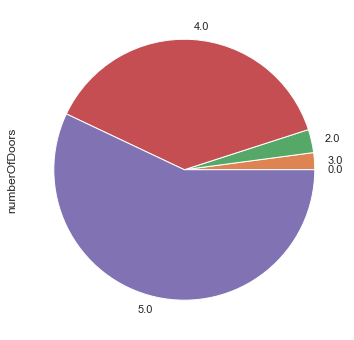

In [151]:
df.numberOfDoors.value_counts(ascending=True).plot.pie(figsize=(6, 6))

Как мы видим, на графике основная часть объявлений авто с 4 и 5 дверями, всё остальное, скорее всего попадает в выбросы, с которыми мы ничего делать не будем

Добавим признак numberOfDoors в списоки

In [130]:
cat_cols.append('numberOfDoors')
drop_cols.append('numberOfDoors')

### 18. parsing_unixtime

In [131]:
df.parsing_unixtime = pd.to_datetime(df.parsing_unixtime,unit='s').dt.date.astype('str')

In [132]:
df.parsing_unixtime.unique()

array(['2020-10-20', '2020-10-19', '2020-10-21', '2020-10-24',
       '2020-10-25', '2020-10-26', 'NaT', '2022-02-21', '2022-02-22',
       '2022-02-24', '2022-02-23'], dtype=object)

In [203]:
df[(df['sample'] == 0)].parsing_unixtime.value_counts()

2020-10-21    15907
2020-10-20     6813
2020-10-19     6441
2020-10-25     2944
2020-10-24     2123
2020-10-26      458
Name: parsing_unixtime, dtype: int64

Будем ориентроваться на 21 октября 2020 года как на эталон, относительно которого будем расчитывать поправочный коэффициент к стоимости авто, относительно изменения курса валют

In [133]:
type(df.parsing_unixtime[0])

str

In [134]:
df.parsing_unixtime = df.parsing_unixtime.apply(lambda value: '2020-09-09' if value == 'NaT' else value)
df.parsing_unixtime.value_counts()

2020-09-09    88966
2020-10-21    15907
2022-02-21     7885
2020-10-20     6813
2020-10-19     6441
2022-02-22     6346
2022-02-23     4899
2022-02-24     3164
2020-10-25     2944
2020-10-24     2123
2020-10-26      458
Name: parsing_unixtime, dtype: int64

Привяжем курс доллара к дате парсинга, чтобы скорректировать цены в датасетах, полученных в разные года

In [207]:
df = df.drop(columns='usd')

In [209]:
df = df.apply(usd, axis=1)
df.head(2)

,bodyType,brand,car_url,color,complectation_dict,description,engineDisplacement,enginePower,equipment_dict,fuelType,image,mileage,modelDate,model_info,model_name,name,numberOfDoors,parsing_unixtime,priceCurrency,productionDate,sell_id,super_gen,vehicleConfiguration,vehicleTransmission,vendor,Owners,Владение,pts,drive,hand,Состояние,Таможня,sample,price,start_date,hidden,Стоимость,model,usd
0,liftback,skoda,https://auto.ru/cars/used/sale/skoda/octavia/1...,blue,NaN,"Все автомобили, представленные в продаже, прох...",1.2,105.0,"{""engine-proof"":true,""tinted-glass"":true,""airb...",petrol,https://autoru.naydex.net/o9DBXQ270/5ac010hAY0...,74000.0,2013,"{""code"":""OCTAVIA"",""name"":""Octavia"",""ru_name"":""...",octavia,1.2 AMT (105 л.с.),5.0,2020-10-20,RUB,2014,1100575026.0,"{""id"":""10373605"",""displacement"":1197,""engine_t...",LIFTBACK ROBOT 1.2,AMT,EUROPEAN,3_or_more,NaN,original,front_wheel,left,Не требует ремонта,Растаможен,0,0.0,NaN,NaN,NaN,skoda_octavia,0.998125
1,liftback,skoda,https://auto.ru/cars/used/sale/skoda/octavia/1...,black,NaN,ЛОТ: 01217195\nАвтопрага Север\nДанный автомоб...,1.6,110.0,"{""cruise-control"":true,""asr"":true,""esp"":true,""...",petrol,https://autoru.naydex.net/o9DBXQ270/5ac010hAY0...,60563.0,2017,"{""code"":""OCTAVIA"",""name"":""Octavia"",""ru_name"":""...",octavia,1.6 MT (110 л.с.),5.0,2020-10-20,RUB,2017,1100549428.0,"{""id"":""20913311"",""displacement"":1598,""engine_t...",LIFTBACK MECHANICAL 1.6,MT,EUROPEAN,1,NaN,original,front_wheel,left,Не требует ремонта,Растаможен,0,0.0,NaN,NaN,NaN,skoda_octavia,0.998125


Сохраним поправочный коэффициент отдельно

In [210]:
df_ratio = df[['usd', 'sample']]
df_ratio

,usd,sample
0,0.998125,0
1,0.998125,0
2,0.998125,0
3,0.998125,0
4,0.998125,0
...,...,...
147820,0.967155,1
147821,0.967155,1
147822,0.967155,1
147823,0.967155,1


In [211]:
df.usd.unique()

array([0.9981251 , 0.99760917, 1.        , 1.01714864, 1.02387299,
       1.026611  , 1.0131684 , 0.96715469])

Отредактируем списки

In [137]:
drop_cols.append('parsing_unixtime')
drop_cols.append('usd')

### 19. priceCurrency

In [138]:
df.priceCurrency.unique()

array(['RUB', nan, 'ruble'], dtype=object)

Признак priceCurrency неинформативен для предсказания стоимости авто
Добавим признак priceCurrency в список drop_cols:

In [139]:
drop_cols.append('priceCurrency')

### 20. productionDate

Это количественный признак, сделаем предположение, что он сильно коррелирует с **modelDate**, мы на это посмотрим, когда постоим матрицу корреляции для количественных признаков

Посмотрим на пропуски

In [140]:
df.productionDate.isnull().sum()

0

In [141]:
df.productionDate.unique()

array([2014, 2017, 2012, 2011, 2019, 2018, 2010, 2020, 2016, 2013, 2006,
       2007, 2015, 2005, 2008, 2009, 1997, 2004, 2002, 1987, 2003, 2001,
       1976, 2000, 1998, 1995, 1999, 1993, 1939, 1996, 1984, 1990, 1991,
       1992, 1989, 1982, 1985, 1994, 1938, 1981, 1988, 1983, 1980, 1986,
       1978, 1970, 1979, 1977, 1972, 1975, 1969, 1950, 1953, 1949, 1937,
       1959, 1968, 1936, 1904, 1974, 1967, 1961, 1960, 1965, 1963, 1957,
       1952, 1973, 1948, 1955, 1964, 1971, 1931, 1927, 1923, 1924, 1932,
       1951, 1954, 1966, '2012', '2018', '2013', '2011', '2008', '2014',
       '2019', '2021', '2007', '2016', '2009', '2004', '2010', '2020',
       '2015', '2017', '1994', '2003', '1998', '2006', '2000', '1990',
       '2005', '1996', '2001', '1991', '1988', '1995', '1993', '1989',
       '2002', '2022', '1999', '1997', '1984', '1987', '1992', '1983',
       '1986', '1985', '1939', '1970', '1968', '1982', '1950', '1946'],
      dtype=object)

In [142]:
df.productionDate = df.productionDate.apply(production_date)

In [143]:
df.productionDate.unique()

array([2014, 2017, 2012, 2011, 2019, 2018, 2010, 2020, 2016, 2013, 2006,
       2007, 2015, 2005, 2008, 2009, 1997, 2004, 2002, 1987, 2003, 2001,
       1976, 2000, 1998, 1995, 1999, 1993, 1939, 1996, 1984, 1990, 1991,
       1992, 1989, 1982, 1985, 1994, 1938, 1981, 1988, 1983, 1980, 1986,
       1978, 1970, 1979, 1977, 1972, 1975, 1969, 1950, 1953, 1949, 1937,
       1959, 1968, 1936, 1904, 1974, 1967, 1961, 1960, 1965, 1963, 1957,
       1952, 1973, 1948, 1955, 1964, 1971, 1931, 1927, 1923, 1924, 1932,
       1951, 1954, 1966, 2021, 2022, 1946])

Посмотрим распределение двух этих признаков по датасету

<AxesSubplot:title={'center':'modelDate'}, ylabel='Frequency'>

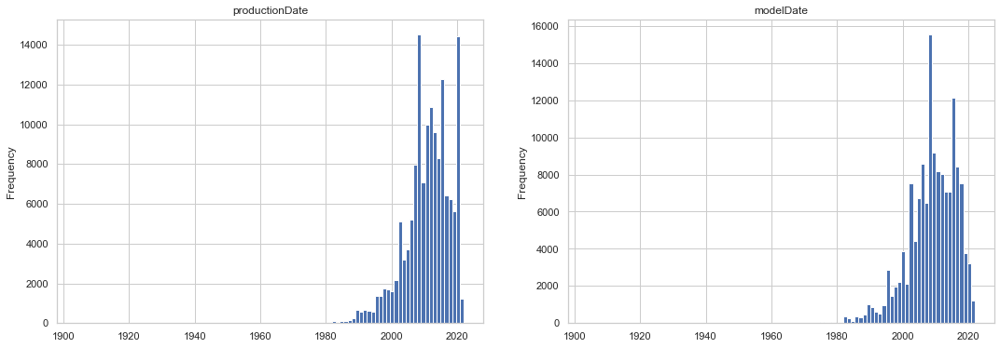

In [166]:

fig, axes = plt.subplots(ncols=2, figsize=(18, 6))
df.productionDate.plot(kind='hist', bins=100, ax=axes[0],
                          grid=True, title='productionDate')
df.modelDate.plot(kind='hist', bins=100, ax=axes[1],
                     grid=True, title='modelDate')

Посмотрим на выбросы:

In [144]:
IQR_outlier(df, 'productionDate', verbose=True)

Для признака productionDate :
25-й перцентиль: 2007.0 75-й перцентиль: 2016.0, IQR: 9.0,  Границы выбросов: [1993.5, 2029.5].
Выбросов, согласно IQR: 3500 | 2.40%


Добавим признак productionDate в список num_cols:

In [145]:
num_cols.append('productionDate')

### 21. sell_id

Признак sell_id неинформативен для предсказания стоимости авто
Добавим признак sell_id в список drop_cols:

In [146]:
drop_cols.append('sell_id')

### 22. super_gen

In [147]:
df.super_gen[56]

'{"id":"20696893","displacement":1395,"engine_type":"GASOLINE","gear_type":"FORWARD_CONTROL","transmission":"ROBOT","power":150,"power_kvt":110,"human_name":"1.4 AMT (150 л.с.)","acceleration":8.8,"clearance_min":164,"fuel_rate":5.8}'

In [148]:
df.super_gen.isnull().sum()

89278

Слишком много пропусков
Добавим признак super_gen в список drop_cols:

In [149]:
drop_cols.append('super_gen')

### 23.vehicleConfiguration

In [150]:
df.vehicleConfiguration[89]

'LIFTBACK AUTOMATIC 1.8'

Признак полностью дублирует такие признаки как bodyType, engineDisplacement и vehicleTransmission
Добавим признак vehicleConfiguration в список drop_cols:

In [151]:
drop_cols.append('vehicleConfiguration')

### 24.vehicleTransmission

Посмотрим какие значения принимает признак и их количество в датасете df:

In [152]:
print('Количество различых типов коробок передач в датасете:', df.vehicleTransmission.nunique())
df.vehicleTransmission.value_counts(dropna=False)

Количество различых типов коробок передач в датасете: 8


AUTOMATIC           48963
автоматическая      34572
MECHANICAL          25159
механическая         8960
роботизированная     8224
ROBOT                7838
VARIATOR             7006
вариатор             5224
Name: vehicleTransmission, dtype: int64

In [153]:
# Исправим регистр:
df.vehicleTransmission = df.vehicleTransmission.str.lower()

In [154]:
df.vehicleTransmission.unique()

array(['роботизированная', 'механическая', 'автоматическая', 'вариатор',
       'mechanical', 'automatic', 'robot', 'variator'], dtype=object)

Сделаем этому признаку позднее one-hot encoding, но сейчас изменим значения признака на принятую аббревиатуру:

In [155]:
dict_Transmission = {'автоматическая':'AT', 'механическая':'MT', 'вариатор':'CVT', 'роботизированная':'AMT',
                     'mechanical':'MT', 'automatic':'AT', 'robot':'AMT', 'variator':'CVT'}
df.vehicleTransmission = df.vehicleTransmission.map(lambda x: dict_Transmission.get(x,x))

Добавим признак vehicleTransmission в списки

In [158]:
cat_cols.append('vehicleTransmission')
drop_cols.append('vehicleTransmission')

### 25.vendor

Посмотрим на регионы-поставщики авто из нашего датасета:

In [159]:
df.vendor.unique()

array(['EUROPEAN', 'JAPANESE', nan, None], dtype=object)

In [160]:
df.brand.unique()

array(['skoda', 'audi', 'honda', 'volvo', 'bmw', 'nissan', 'infiniti',
       'mercedes', 'toyota', 'lexus', 'volkswagen', 'mitsubishi',
       'cadillac', 'chery', 'chevrolet', 'chrysler', 'citroen', 'daewoo',
       'dodge', 'ford', 'geely', 'hyundai', 'jaguar', 'jeep', 'kia',
       'mazda', 'mini', 'opel', 'peugeot', 'porsche', 'renault', 'subaru',
       'suzuki', 'great_wall', 'land_rover', 'ssang_yong'], dtype=object)

In [161]:
df = df.apply(vendor, axis=1)
df.vendor.unique()

array(['EUROPEAN', 'JAPANESE', 'USA', 'CHINESE', 'KOREAN'], dtype=object)

Добавим признак vendor в список cat_cols

In [162]:
cat_cols.append('vendor')
drop_cols.append('vendor')

### 26.Владельцы

Переименуем столбец

In [163]:
df.rename(columns = {'Владельцы':'Owners'}, inplace = True)

Изменим значения признака на понятные значения:

In [164]:
dict_Owners = {'3 или более':'3_or_more', '1\xa0владелец':'1', '2\xa0владельца':'2', 3:'3_or_more', 2:'2', 1:'1'}
df.Owners = df.Owners.fillna('unknown')
df.Owners = df.Owners.map(lambda x: dict_Owners.get(x,x))

In [165]:
df.Owners.unique()

array(['3_or_more', '1', '2', 'unknown'], dtype=object)

Добавим признак Owners в списки

In [166]:
cat_cols.append('Owners')
drop_cols.append('Owners')

### 27.Владение

In [167]:
df['Владение'][456]

'1 год и 10 месяцев'

Признак Владение имеет более 72,13% пропусков, мы его удалим.
Добавим признак Владение в список drop_cols:

In [168]:
drop_cols.append('Владение')

### 28.ПТС

Переименуем столбец

In [169]:
df.rename(columns = {'ПТС':'pts'}, inplace = True)

In [170]:
df.pts.unique()

array(['Оригинал', 'Дубликат', nan, 'ORIGINAL', 'DUPLICATE'], dtype=object)

In [171]:
df.pts.value_counts(dropna=False)

ORIGINAL     78229
Оригинал     49637
DUPLICATE    10376
Дубликат      7342
NaN            362
Name: pts, dtype: int64

In [172]:
df.pts = df.pts.str.lower()

Наличие дубликата ПТС несёт в себе риски при продаже автомобиля, и возможно, имеет какое-то влияние на цену
И тут нет зависимости от того, когда был выпущен автомобиль
В подтверждение наших доводов, посмотрим, какой ПТС у самого старого авто в датасете:

In [173]:
df[(df.productionDate == df.productionDate.min())]['pts']

16944    оригинал
Name: pts, dtype: object

Заполним пропуски (у признака только один пропуск):

In [174]:
df.pts = df.pts.fillna(df.pts.mode()[0])

In [175]:
dict_PTS = {'оригинал':'original', 'дубликат':'duplicate'}
df['pts'] = df['pts'].map(lambda x: dict_PTS.get(x,x))

Добавим признак ПТС в списки

In [176]:
cat_cols.append('pts')
drop_cols.append('pts')

### 29.Привод

In [178]:
df['Привод'].isnull().sum()

0

In [179]:
df['Привод'].unique()

array(['передний', 'полный', 'задний'], dtype=object)

Переименуем столбец

In [180]:
df.rename(columns={'Привод': 'drive'}, inplace=True)

Изменим значения признака на принятую аббревиатуру:

In [181]:
dict_drive = {'передний': 'front_wheel', 'полный': 'four_wheel', 'задний': 'rear'}
df.drive = df.drive.map(lambda x: dict_drive.get(x, x))

Добавим признак Drive в списки

In [182]:
cat_cols.append('drive')
drop_cols.append('drive')

### 30.Руль

In [183]:
df['Руль'].isnull().sum()

0

In [184]:
df['Руль'].unique()

array(['Левый', 'Правый', 'LEFT', 'RIGHT'], dtype=object)

In [185]:
df['Руль'] = df['Руль'].str.lower()

Переименуем столбец

In [186]:
df.rename(columns={'Руль': 'hand'}, inplace=True)

Изменим значения признака на принятую аббревиатуру:

In [187]:
dict_rudder = {'левый': 'left', 'правый': 'right'}
df.hand = df.hand.map(lambda x: dict_rudder.get(x, x))

In [188]:
df.hand.unique()

array(['left', 'right'], dtype=object)

Добавим признак hand в списки

In [189]:
cat_cols.append('hand')
drop_cols.append('hand')

### 31.Состояние

In [190]:
df['Состояние'].isnull().sum()

88988

In [191]:
df['Состояние'].unique()

array(['Не требует ремонта', nan, None], dtype=object)

Признак имеет одно значение для всей выборки и 88988 пропусков, поэтому удаляем его
Добавим признак Состояние в список drop_cols:

In [192]:
drop_cols.append('Состояние')

### 32.Таможня

In [193]:
df['Таможня'].isnull().sum()

42

In [194]:
df['Таможня'].unique()

array(['Растаможен', True, None], dtype=object)

Признак имеет одно значение для всей выборки, поэтому удаляем его
Добавим признак Таможня в список drop_cols:

In [195]:
drop_cols.append('Таможня')

### 33. start_date

In [196]:
df['start_date'].isnull().sum()

56980

Признак имеет 56980 пропусков, поэтому удаляем его
Добавим признак start_date в список drop_cols:

In [197]:
drop_cols.append('start_date')

### 34. hidden

In [198]:
df['hidden'].isnull().sum()

145946

Признак имеет 145946 пропусков, поэтому удаляем его
Добавим признак start_date в список drop_cols:

In [199]:
drop_cols.append('hidden')

### 35. Стоимость

Дублирует price
Добавим признак Стоимость в список drop_cols:

In [200]:
drop_cols.append('Стоимость')

## Количественные признаки

Посмотрим распределение числовых параметров

<Figure size 864x432 with 0 Axes>

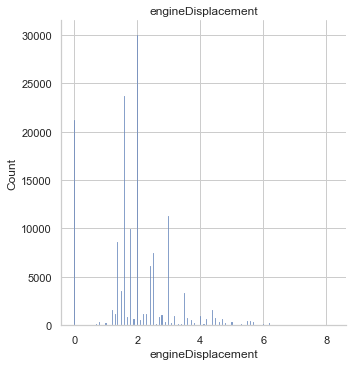

<Figure size 864x432 with 0 Axes>

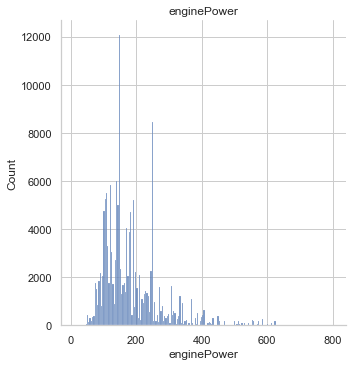

<Figure size 864x432 with 0 Axes>

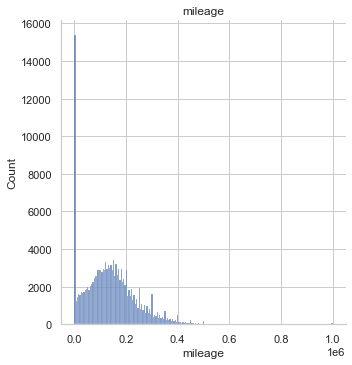

<Figure size 864x432 with 0 Axes>

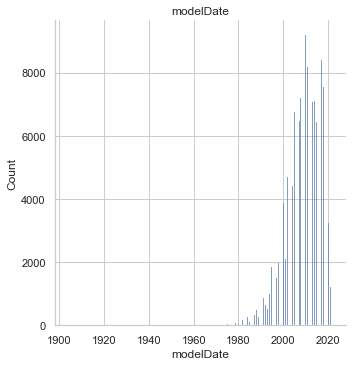

<Figure size 864x432 with 0 Axes>

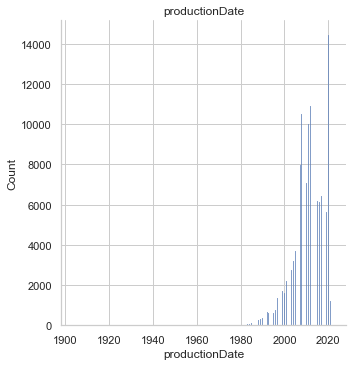

In [219]:
for col in num_cols:
    plt.figure()
    sns.displot(df[col], kde = False, rug=False)
    plt.title(col)
    plt.show()

Перед логорифмированием внесем поправку в price

In [212]:
df.price = df.price.astype(float) * df_ratio.usd

логарифмируем числовые переменные, чтобы сгладить разницу в размерности и уменьшить выбросы

In [213]:
#num_cols.append('price')
for col in num_cols:
    df[col] =  np.log(df[col] + 1)

Посмотрим сколько выбросов осталось в числовых признаках после логарифмирования:

In [214]:
for col in num_cols:
    IQR_outlier(df, col, verbose=True)
    print()
# num_cols.remove('price')

Для признака engineDisplacement :
25-й перцентиль: 0.9162907318741551 75-й перцентиль: 1.2237754316221157, IQR: 0.30748469974796055,  Границы выбросов: [0.4550636822522143, 1.6850024812440565].
Выбросов, согласно IQR: 26899 | 18.43%

Для признака enginePower :
25-й перцентиль: 4.812184355372417 75-й перцентиль: 5.41610040220442, IQR: 0.6039160468320031,  Границы выбросов: [3.9063102851244125, 6.321974472452425].
Выбросов, согласно IQR: 1181 | 0.81%

Для признака mileage :
25-й перцентиль: 11.097425172408931 75-й перцентиль: 12.190964083849375, IQR: 1.0935389114404437,  Границы выбросов: [9.457116805248265, 13.83127245101004].
Выбросов, согласно IQR: 17429 | 11.94%

Для признака modelDate :
25-й перцентиль: 7.603897968521881 75-й перцентиль: 7.608374474380783, IQR: 0.0044765058589018025,  Границы выбросов: [7.597183209733529, 7.615089233169136].
Выбросов, согласно IQR: 4153 | 2.85%

Для признака productionDate :
25-й перцентиль: 7.60489448081162 75-й перцентиль: 7.6093665379542115, IQR:

посмотрим на корреляцию между собой числовых переменных

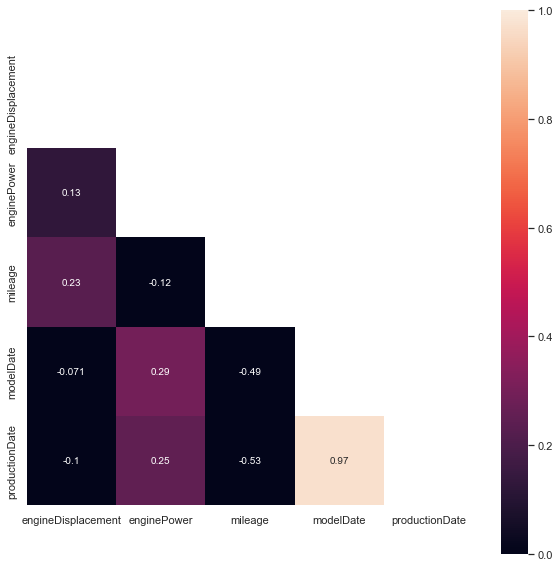

In [223]:
heatmap(df, num_cols, 'pearson')

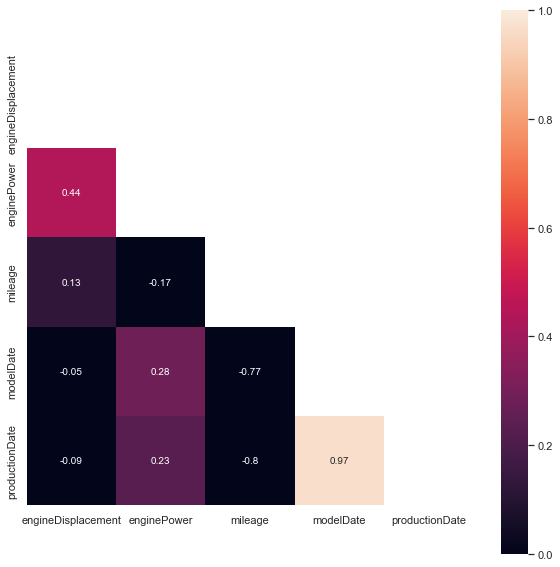

In [224]:
heatmap(df, num_cols, 'spearman')

modelDate и productionDate сильно коррелируют: удалим modelDate

In [215]:
num_cols.remove('modelDate')
drop_cols.append('modelDate')

## Kатегориальные переменные

Для категориальных признаков мы будем использовать OneHotEncoder

In [217]:
encoder = OneHotEncoder(sparse = False)
X_cat = encoder.fit_transform(df[cat_cols].values)

In [218]:
list_of_cols = encoder.get_feature_names(cat_cols).tolist()
X_cat_column = pd.DataFrame(X_cat, columns = list_of_cols)
df = pd.concat([df,X_cat_column],axis = 1)

Удалим признаки из списка drop_cols из нашего датасета:

In [219]:
df.drop(drop_cols, axis = 1, inplace=True)

In [220]:
df.head()

,engineDisplacement,enginePower,mileage,productionDate,sample,price,bodyType_SUV_5,bodyType_hatchback,bodyType_liftback,bodyType_rare,bodyType_sedan,bodyType_station_wagon,brand_audi,brand_bmw,brand_cadillac,brand_chery,brand_chevrolet,brand_chrysler,brand_citroen,brand_daewoo,brand_dodge,brand_ford,brand_geely,brand_great_wall,brand_honda,brand_hyundai,brand_infiniti,brand_jaguar,brand_jeep,brand_kia,brand_land_rover,brand_lexus,brand_mazda,brand_mercedes,brand_mini,brand_mitsubishi,brand_nissan,brand_opel,brand_peugeot,brand_porsche,brand_renault,brand_skoda,brand_ssang_yong,brand_subaru,brand_suzuki,brand_toyota,brand_volkswagen,brand_volvo,color_black,color_blue,color_gray,color_rare,color_red,color_white,fuelType_diesel,fuelType_electro,fuelType_gas,fuelType_gbo,fuelType_hybrid,fuelType_petrol,model_audi_a6,model_audi_audi,model_audi_rare,model_bmw_3er,model_bmw_5er,model_bmw_bmw,model_bmw_rare,model_bmw_x5,model_cadillac_rare,model_chery_rare,model_chevrolet_rare,model_chrysler_rare,model_citroen_rare,model_daewoo_rare,model_dodge_rare,model_ford_focus,model_ford_rare,model_geely_rare,model_great_wall_rare,model_honda_rare,model_hyundai_rare,model_hyundai_solaris,model_infiniti_rare,model_jaguar_rare,model_jeep_rare,model_kia_rare,model_kia_rio,model_land_rover_rare,model_lexus_rare,model_mazda_rare,model_mercedes_e_klasse,model_mercedes_mercedes-benz,model_mercedes_rare,model_mini_rare,model_mitsubishi_lancer,model_mitsubishi_outlander,model_mitsubishi_rare,model_nissan_qashqai,model_nissan_rare,model_nissan_x_trail,model_opel_astra,model_opel_rare,model_peugeot_rare,model_porsche_rare,model_renault_rare,model_skoda_octavia,model_skoda_rare,model_skoda_skoda,model_ssang_yong_rare,model_subaru_rare,model_suzuki_rare,model_toyota_camry,model_toyota_rare,model_volkswagen_passat,model_volkswagen_polo,model_volkswagen_rare,model_volkswagen_tiguan,model_volvo_rare,numberOfDoors_0.0,numberOfDoors_2.0,numberOfDoors_3.0,numberOfDoors_4.0,numberOfDoors_5.0,vehicleTransmission_AMT,vehicleTransmission_AT,vehicleTransmission_CVT,vehicleTransmission_MT,vendor_CHINESE,vendor_EUROPEAN,vendor_JAPANESE,vendor_KOREAN,vendor_USA,Owners_1,Owners_2,Owners_3_or_more,Owners_unknown,pts_duplicate,pts_original,drive_four_wheel,drive_front_wheel,drive_rear,hand_left,hand_right
0,0.788457,4.663439,11.211834,7.608374,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
1,0.955511,4.709530,11.011456,7.609862,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
2,1.029619,5.030438,11.385103,7.608374,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1

In [224]:
df = df.dropna()

In [226]:
df['sample'].unique()

array([0., 1.])

In [227]:
df.isnull().sum()

engineDisplacement    0
enginePower           0
mileage               0
productionDate        0
sample                0
                     ..
drive_four_wheel      0
drive_front_wheel     0
drive_rear            0
hand_left             0
hand_right            0
Length: 143, dtype: int64

Проверяем, что размер df_test не изменился:

In [228]:
df[(df['sample'] == 0)].shape

(34686, 143)

In [229]:
df.shape

(144154, 143)

**Разделяем датасет data обратно на df_train и df_test**

In [320]:
df_0 = df.copy()

In [321]:
train = df_0.query('sample == 1').drop(['sample'], axis=1)
display(train.shape)
test = df_0.query('sample == 0').drop(['sample', 'price'], axis=1)
display(test.shape)

(109468, 142)

(34686, 141)

Нормализация численных данных
Для тестовой выборки

In [322]:
scaler_test = RobustScaler()
for column in num_cols:
    test[column] = scaler_test.fit_transform(np.array(test[column].values).reshape(-1, 1))

In [323]:
scaler_train = RobustScaler()
for column in num_cols:
    train[column] = scaler_test.fit_transform(np.array(train[column].values).reshape(-1, 1))

# Model

In [380]:
X = train.loc[:, train.columns != 'price'].values
y = train['price'].values

In [381]:
X_test = test.values

In [382]:
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.15, shuffle=True, random_state=RANDOM_SEED)

## LinearRegression

In [313]:
model1 = LinearRegression()
model1.fit(X_train, y_train)

y_pred = model1.predict(X_valid)
display(y_pred.shape)
print(f"Точность наивной модели по метрике MAPE: {mean_absolute_percentage_error(y_valid, y_pred) * 100}%")

(16421,)

Точность наивной модели по метрике MAPE: 119.91396953698528%


## RandomForestRegressor

In [246]:
#param = {'n_estimators': [400],
#'max_features': ['auto'],
##'max_depth': [None, 10, 20, 30, 40],
#'min_samples_split': [1, 2, 5, 10, 20],
#'min_samples_leaf': [1, 2, 4, 8, 12]}

In [247]:
#rf = RandomForestRegressor(random_state=42)
#rcv = RandomizedSearchCV(estimator=rf, param_distributions=param, cv=3, n_jobs=-1,
                          #scoring='neg_mean_absolute_percentage_error', n_iter=20)

#rcv.fit(X_train, y_train)
#predict = rcv.predict(X_test)
#predict = np.exp(predict)
#MAPE = mean_absolute_percentage_error(y_test, predict) * 100
#MAPE 

In [248]:
#rcv.best_params_

In [328]:
rf = RandomForestRegressor(random_state=42)

rf.fit(X_train, y_train)
y_pred = rf.predict(X_valid)

print(f"Точность модели по метрике MAPE: {mean_absolute_percentage_error(y_valid, y_pred) * 100}%")

Точность модели по метрике MAPE: 16.369498059727487%


In [422]:
# На всей выборке:
rf = RandomForestRegressor(random_state=42)

rf.fit(X, y)

RandomForestRegressor(random_state=42)

**Score (Leaderboard): 35.58233**

## BaggingRegressor

In [278]:
from sklearn.svm import SVR
from sklearn.ensemble import BaggingRegressor

regr = BaggingRegressor(base_estimator=SVR(), n_estimators=10, random_state=0).fit(X_train, y_train)
y_pred = regr.predict(X_valid)

print(f"Точность модели по метрике MAPE: {mean_absolute_percentage_error(y_valid, y_pred) * 100}%")

Точность модели по метрике MAPE: 117.33632236010017%


## XGBRegressor

In [250]:
# param = {'n_estimators': [1000],
#          'colsample_bytree': [0.5, 0.75, 1.0],
#          'min_child_weight': [1, 3, 5],
#          'eta': [0.2],
#          'max_depth': [3, 6, 8],
#          'subsample': [0.5, 1.0]}

In [251]:
# xgb = XGBRegressor(n_estimators=500, eval_metric='mape',random_state=42)
# rcv = RandomizedSearchCV(estimator=xgb, param_distributions=param, cv=3, n_jobs=-1,
#                          scoring='neg_mean_absolute_percentage_error', n_iter=15)

# rcv.fit(X_train, y_train)
# predict = rcv.predict(X_test)
# predict = np.exp(predict)
# MAPE = mean_absolute_percentage_error(y_test, predict) * 100
# MAPE

In [252]:
# rcv.best_params_

In [249]:
xgb = XGBRegressor()

xgb.fit(X_train,y_train)
y_pred = xgb.predict(X_valid)

print(f"Точность модели XGBoost по метрике MAPE: {mean_absolute_percentage_error(y_valid, y_pred) * 100}%")

Точность модели XGBoost по метрике MAPE: 19.74194989210141%


In [421]:
# На всей выборке:
xgb = XGBRegressor()

xgb.fit(X, y)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

**Score (Leaderboard): 34.83254**

## ExtraTreesRegressor

In [254]:
# param = {'n_estimators': [200],
#          'max_features': ['auto'],
#          'max_depth': [None, 10, 20, 30, 40],
#          'min_samples_split': [1, 2, 5, 10, 20],
#          'min_samples_leaf': [1, 2, 4, 8, 12],
#          'bootstrap': [True, False]}

In [255]:
#etr = ExtraTreesRegressor(n_estimators=800, random_state=42, n_jobs=-1,
                          #bootstrap=False, min_samples_split=10, min_samples_leaf=1,
                          #max_features='auto', max_depth=20)
#etr.fit(X_train, y_train)
#predict = etr.predict(X_test)
#predict = np.exp(predict)
#MAPE = mean_absolute_percentage_error(y_test, predict) * 100
#MAPE

In [256]:
# rcv.best_params_

In [359]:
etr = ExtraTreesRegressor(random_state=RANDOM_SEED)
etr.fit(X_train,y_train)
y_pred = etr.predict(X_valid)
print(f"Точность модели по метрике MAPE: {mean_absolute_percentage_error(y_valid, y_pred) * 100}%")

Точность модели по метрике MAPE: 16.96255159566179%


In [423]:
# На всей выборке:
etr = ExtraTreesRegressor(random_state=RANDOM_SEED)

etr.fit(X,y)

ExtraTreesRegressor(random_state=42)

**Score (Leaderboard): 31.89884**

## LGBMRegressor

In [258]:
# param = {'n_estimators': [2500],
#          'learning_rate': [0.1],
#          'max_depth': [-1, 2, 4, 6],
#          'num_leaves': [20, 30 , 40, 50],
#          'min_child_samples': [None, 5, 10, 20],
#          'lambda_l2': [0.05, 0.1, 0.3, 0.8, 1.5]}

In [259]:
# lgbm = LGBMRegressor(objective='regression', random_state=30)
# rcv = RandomizedSearchCV(estimator=lgbm, param_distributions=param, cv=3, n_jobs=-1,
#                          scoring='neg_mean_absolute_percentage_error', n_iter=15)

# rcv.fit(X_train, y_train)
# predict = rcv.predict(X_test)
# predict = np.exp(predict)
# MAPE = mean_absolute_percentage_error(y_test, predict) * 100
# MAPE

In [260]:
# rcv.best_params_

In [261]:
#lgbm = LGBMRegressor(objective='mape', 
                   #  random_state=30,
                   #  n_estimators=2500,
                   #  learning_rate=0.05,
                   #  lambda_l2=0.5)

#lgbm.fit(X_train, y_train,
      #   eval_set=(X_test, np.log(y_test)))

In [262]:
#predict = lgbm.predict(X_test)
#predict = np.exp(predict)
#MAPE = mean_absolute_percentage_error(y_test, predict) * 100
#MAPE

Модель с параметрами по умолчанию

In [418]:
lgbm = LGBMRegressor(random_state=RANDOM_SEED)
lgbm.fit(X_train,y_train)
y_pred = lgbm.predict(X_valid)
print(f"Точность модели по метрике MAPE: {mean_absolute_percentage_error(y_valid, y_pred) * 100}%")

Точность модели по метрике MAPE: 24.0616251217694%


In [420]:
# На всей выборке:
lgbm = LGBMRegressor(random_state=RANDOM_SEED)

lgbm.fit(X, y)

LGBMRegressor(random_state=42)

**Score (Leaderboard): 31.87037**

## CATboost

In [264]:
#params = {'iterations': [5000],
         # 'depth': [None, 4, 5, 6, 7],
         # 'l2_leaf_reg': [0.1, 0.4, 1, 3, 5],
         # 'random_strength': [0, 0.3, 0.7, 1]}

In [265]:
#cbr = CatBoostRegressor(random_seed=20, loss_function='MAPE',
                      #  eval_metric='MAPE', verbose=0)
#rs_cbr = cbr.randomized_search(params, X, y, cv=3, n_iter=20)
#rs_cbr['params']

In [383]:
cbr = CatBoostRegressor(iterations=5000,
                        random_seed=30,
                        loss_function='MAPE',
                        learning_rate=0.06,
                        depth=7,
                        random_strength=0.3,
                        l2_leaf_reg=0.4)

cbr.fit(X_train, y_train,
        eval_set=(X_valid,y_valid),
        verbose_eval=0,
        use_best_model=True)

In [384]:
y_pred = cbr.predict(X_valid)

print(f"Точность модели по метрике MAPE: {mean_absolute_percentage_error(y_valid, y_pred) * 100}%")

Точность модели по метрике MAPE: 63.053594364484525%


## StackingRegressor

- **RandomForestRegressor, CatBoostRegressor, XGBRegressor, ExtraTreesRegressor**

In [254]:
estimators = [('rf', rf), ('cbr', cbr), ('xgb', xgb), ('etr', etr)]
stacking = StackingRegressor(estimators=estimators,
                             final_estimator=Ridge())
stacking.fit(X_train, y_train)

0:	learn: 0.6789734	total: 15ms	remaining: 1m 14s
1:	learn: 0.6746999	total: 26.7ms	remaining: 1m 6s
2:	learn: 0.6703995	total: 38ms	remaining: 1m 3s
3:	learn: 0.6622639	total: 49.5ms	remaining: 1m 1s
4:	learn: 0.6603838	total: 60.7ms	remaining: 1m
5:	learn: 0.6591822	total: 72.3ms	remaining: 1m
6:	learn: 0.6532921	total: 83.8ms	remaining: 59.8s
7:	learn: 0.6492777	total: 94.9ms	remaining: 59.2s
8:	learn: 0.6468884	total: 106ms	remaining: 58.9s
9:	learn: 0.6450066	total: 118ms	remaining: 58.7s
10:	learn: 0.6445042	total: 129ms	remaining: 58.5s
11:	learn: 0.6427114	total: 140ms	remaining: 58.3s
12:	learn: 0.6425914	total: 151ms	remaining: 58s
13:	learn: 0.6417994	total: 162ms	remaining: 57.8s
14:	learn: 0.6416722	total: 173ms	remaining: 57.6s
15:	learn: 0.6416533	total: 185ms	remaining: 57.6s
16:	learn: 0.6416272	total: 197ms	remaining: 57.7s
17:	learn: 0.6416109	total: 209ms	remaining: 57.7s
18:	learn: 0.6415947	total: 225ms	remaining: 58.9s
19:	learn: 0.6415695	total: 243ms	remaining:

StackingRegressor(estimators=[('rf', RandomForestRegressor(random_state=42)),
                              ('cbr',
                               <catboost.core.CatBoostRegressor object at 0x7fc54c8410a0>),
                              ('xgb',
                               XGBRegressor(base_score=0.5, booster='gbtree',
                                            colsample_bylevel=1,
                                            colsample_bynode=1,
                                            colsample_bytree=1, gamma=0,
                                            gpu_id=-1, importance_type='gain',
                                            interaction_constraints='',
                                            learning_rate=0.300000012,
                                            max_delta_step=0, max_depth=6,
                                            min_child_weight=1, missing=nan,
                                            monotone_constraints='()',
                             

In [257]:
y_pred = stacking.predict(X_valid)
print(f"Точность модели по метрике MAPE: {mean_absolute_percentage_error(y_valid, y_pred) * 100}%")

Точность модели по метрике MAPE: 16.19772314837771%


**Score (Leaderboard): 30.82901**

- **RandomForestRegressor, LGBMRegressor, XGBRegressor, ExtraTreesRegressor**

In [279]:
estimators = [('rf', rf), ('lgbm', lgbm), ('xgb', xgb), ('etr', etr)]
stacking_2 = StackingRegressor(estimators=estimators,
                             final_estimator=Ridge())
stacking_2.fit(X_train, y_train)

StackingRegressor(estimators=[('rf', RandomForestRegressor(random_state=42)),
                              ('lgbm', LGBMRegressor(random_state=42)),
                              ('xgb',
                               XGBRegressor(base_score=0.5, booster='gbtree',
                                            colsample_bylevel=1,
                                            colsample_bynode=1,
                                            colsample_bytree=1, gamma=0,
                                            gpu_id=-1, importance_type='gain',
                                            interaction_constraints='',
                                            learning_rate=0.300000012,
                                            max_delta_step=0, max_depth=6,
                                            min_child_weight=1, missing=nan,
                                            monotone_constraints='()',
                                            n_estimators=100, n_jobs=0,
               

In [280]:
y_pred = stacking_2.predict(X_valid)
print(f"Точность модели по метрике MAPE: {mean_absolute_percentage_error(y_valid, y_pred) * 100}%")

Точность модели по метрике MAPE: 16.456552821033355%


In [396]:
# На всей выборке:
rf = RandomForestRegressor(random_state=RANDOM_SEED)
lgbm = LGBMRegressor(random_state=RANDOM_SEED)
xgb = XGBRegressor()
etr = ExtraTreesRegressor(random_state=RANDOM_SEED)
estimators = [('rf', rf), ('lgbm', lgbm), ('xgb', xgb), ('etr', etr)]
stacking_3 = StackingRegressor(estimators=estimators,
                             final_estimator=Ridge())
stacking_3.fit(X, y)

StackingRegressor(estimators=[('rf', RandomForestRegressor(random_state=42)),
                              ('lgbm', LGBMRegressor(random_state=42)),
                              ('xgb',
                               XGBRegressor(base_score=None, booster=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, gamma=None,
                                            gpu_id=None, importance_type='gain',
                                            interaction_constraints=None,
                                            learning_rate=None,
                                            max_delta_step=None, max_depth=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            n_estimators=100, n_jobs=Non

**Score (Leaderboard): 30.21782**

- **LGBMRegressor, CatBoostRegressor, XGBRegressor, ExtraTreesRegressor**

In [407]:
cbr = CatBoostRegressor(iterations=5000,
                        random_seed=30,
                        loss_function='MAPE',
                        learning_rate=0.06,
                        depth=7,
                        random_strength=0.3,
                        l2_leaf_reg=0.4)
lgbm = LGBMRegressor(random_state=RANDOM_SEED)
xgb = XGBRegressor()
etr = ExtraTreesRegressor(random_state=RANDOM_SEED)
estimators = [('cbr', cbr), ('lgbm', lgbm), ('xgb', xgb), ('etr', etr)]
stacking_4 = StackingRegressor(estimators=estimators,
                             final_estimator=RandomForestRegressor(random_state=RANDOM_SEED))
stacking_4.fit(X, y) # сразу на всей выборке

0:	learn: 0.6763416	total: 135ms	remaining: 11m 15s
1:	learn: 0.6663944	total: 173ms	remaining: 7m 11s
2:	learn: 0.6576977	total: 192ms	remaining: 5m 19s
3:	learn: 0.6570238	total: 205ms	remaining: 4m 16s
4:	learn: 0.6564471	total: 218ms	remaining: 3m 38s
5:	learn: 0.6559089	total: 231ms	remaining: 3m 12s
6:	learn: 0.6497183	total: 245ms	remaining: 2m 54s
7:	learn: 0.6417002	total: 259ms	remaining: 2m 41s
8:	learn: 0.6410456	total: 273ms	remaining: 2m 31s
9:	learn: 0.6361917	total: 289ms	remaining: 2m 24s
10:	learn: 0.6322551	total: 303ms	remaining: 2m 17s
11:	learn: 0.6291468	total: 319ms	remaining: 2m 12s
12:	learn: 0.6268213	total: 344ms	remaining: 2m 11s
13:	learn: 0.6267177	total: 369ms	remaining: 2m 11s
14:	learn: 0.6265246	total: 401ms	remaining: 2m 13s
15:	learn: 0.6263099	total: 423ms	remaining: 2m 11s
16:	learn: 0.6261167	total: 462ms	remaining: 2m 15s
17:	learn: 0.6255271	total: 481ms	remaining: 2m 13s
18:	learn: 0.6253556	total: 500ms	remaining: 2m 11s
19:	learn: 0.6252795	

StackingRegressor(estimators=[('cbr',
                               <catboost.core.CatBoostRegressor object at 0x7fc54c3b8f40>),
                              ('lgbm', LGBMRegressor(random_state=42)),
                              ('xgb',
                               XGBRegressor(base_score=None, booster=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, gamma=None,
                                            gpu_id=None, importance_type='gain',
                                            interaction_constraints=None,
                                            learning_rate=None,
                                            max_de...
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            n_e

**Score (Leaderboard): 38.59458**

In [430]:
final_model = stacking_3

In [431]:
#Записываем значения для submission
y_test = final_model.predict(X_test)

In [432]:
predict_submission = y_test / df_ratio.query('sample == 0')['usd']

In [433]:
sample_submission = pd.read_csv('sample_submission.csv')

In [434]:
sample_submission['price'] = predict_submission
sample_submission.to_csv('submission.csv', index=False)
sample_submission.head(10)

,sell_id,price
0,1100575026,7.866910e+05
1,1100549428,1.226346e+06
2,1100658222,1.034398e+06
3,1100937408,7.400639e+05
4,1101037972,9.479206e+05
5,1100912634,9.551754e+05
6,1101228730,8.234549e+05
7,1100165896,5.163373e+05
8,1100768262,1.647853e+06
9,1101218501,1.046364e+06


# Выводы

Лучший Score на Leaderboard: **30.21782**

  XGBoost и LightGBM очень мощные библиотеки для построения моделей градиентного бустинга на решающих деревьях.     Преимущества Light GBM:быстрая скорость обучения и высокая эффективность.
  Алгоритм XGBoost обладает высокой предсказательной способностью и в разы быстрее любых других методов градиентного бустинга, включает в себя различные регуляризации, что уменьшает переобучение и улучшает общую производительность.RandomForestRegressor имеет следующие преимущества:имеет высокую точность предсказания, которая сравнима с результатами градиентного бустинга; не требует тщательной настройки параметров, хорошо работает из коробки; редко переобучается. На практике добавление деревьев только улучшает композицию; хорошо работает с пропущенными данными – сохраняет хорошую точность даже при их наличии.    В Catboost прогнозы делаются на основе ансамбля слабых обучающих алгоритмов. В отличие от случайного леса, который создает дерево решений для каждой выборки, в градиентном бустинге деревья создаются последовательно. Предыдущие деревья в модели не изменяются. Результаты предыдущего дерева используются для улучшения последующего.
  В мире машинного обучения одними из самых популярных типов моделей являются решающее дерево и ансамбли на их основе. Преимуществами деревьев являются: простота интерпретации, нет ограничений на вид исходной зависимости, мягкие требования к размеру выборки. Деревья имеют и крупный недостаток — склонность к переобучению. Поэтому почти всегда деревья объединяют в ансамбли: случайный лес, градиентный бустинг и др. Сложными теоретическими и практическим задачами являются составление деревьев и объединение их в ансамбли.Extra Trees — это метод ансамблевого обучения, который объединяет результаты нескольких не коррелированных деревьев решений, собранных в «лесу», для вывода результатов.Лучшим из рассмотренных себя проявил staking моделей RandomForestRegressor, LGBMRegressor, XGBRegressor, ExtraTreesRegressor с мета моделью линейной регрессии. 